# Analysis of single-cell RNA-seq data for Mouse Retinal Development


This Python notebook performs an analysis of the cell types and their marker genes on provided GSE118614_Smart dataset.

# Analysis of 10X data


In [1]:
import numpy as np
import pandas as pd
# from pandas.core import frame
import scanpy as sc
# import matplotlib.pyplot as plt
# from sklearn.neighbors import NearestNeighbors
# from sklearn.neighbors import DistanceMetric
# from sklearn.decoHeylsition import PCA
from sklearn.metrics import adjusted_rand_score
from sklearn.cluster import KMeans
import re
import collections
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

In [2]:
def cmake_unique(icat):
    ocat=icat.copy()
    ocat=list(ocat)
    for ii in range(len(ocat)):
        for jj in range(ii+1,len(ocat)):
            if ocat[ii]==ocat[jj]:
                ocat[jj]=ocat[jj]+'0'
    return ocat

## Quality control
First read in the data

The count matrix is provided in .mtx format and can be downloaded here: [10x_mouse_retina_development.mtx](https://www.dropbox.com/s/6d76z4grcnaxgcg/10x_mouse_retina_development.mtx?dl=0)

matrix.mtx - The count matrix containing raw counts for barcodes. Rows correspond to cells and columns to genes

genes.tsv - contains the ensembl IDs labelling the genes in each column of the counts matrix

barcodes.tsv - contains the cell barcodes labelling the cells in each row of the counts matrix

10x_Mouse_retina_pData_umap2_CellType_annot_w_horiz.csv - Cellular Phenotype Data

In [3]:
sc.settings.verbosity = 3            
sc.settings.set_figure_params(dpi=80, facecolor='white')

this file that will store the analysis results

In [4]:
results_file = 'swrite10x/retsmart.h5ad'  


Reading the data

In [5]:
adata = sc.read_10x_mtx(
    'sdata10x',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading
cells = pd.read_csv('sdata10x/10x_Mouse_retina_pData_umap2_CellType_annot_w_horiz.csv')
adata.obs['CellType']=cells['umap2_CellType'].values
adata.obs['oCellType']=cells['old_CellType_annot'].values

adata.obs['Age']=cells['age'].values
adata.obs['Plate']=cells['sample'].values


... reading from cache file cache\sdata10x-matrix.h5ad


Extracting E14, E18, and P2 data

In [6]:
adata_All=adata.copy()

adata=adata[(adata.obs['Age']=='E14') | (adata.obs['Age']=='E18') | (adata.obs['Age']=='P2'),:]

adata.var_names_make_unique()

adata.obs_names_make_unique()

nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')

Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


Data has 27998 genes in 60366 cells


To identify potential doublets in the data each cell can be scored using the method of Wollock et al. 2018. Here we haven't performed this analysis.

 Let’s assemble some information about mitochondrial genes, ribosormal genes, and hemoglobin genes, which are important for quality control. Citing from “Simple Single Cell” workflows (Lun, McCarthy & Marioni, 2017): High proportions are indicative of poor-quality cells (Islam et al. 2014; Ilicic et al. 2016),  possibly because of loss of cytoplasmic RNA from perforated cells. The reasoning is that mitochondria are larger than individual transcript molecules and less likely to escape through tears in the cell membrane. 


In [7]:
# Calculate mitochondrial gene content
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
adata.var['hb'] = adata.var_names.str.startswith(("Hba","Hbb","Hbq"))

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

A violin and scatter plot of some of the computed quality measures: the number of genes expressed in the count matrix, the total counts per cell, the percentage of counts in mitochondrial genes. n_genes_by_counts is the number of unique genes expressed in each cells, and total_counts is the total number of genes expressed in each cell.

C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'CellType' as categorical
C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'oCellType' as categorical
C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version.

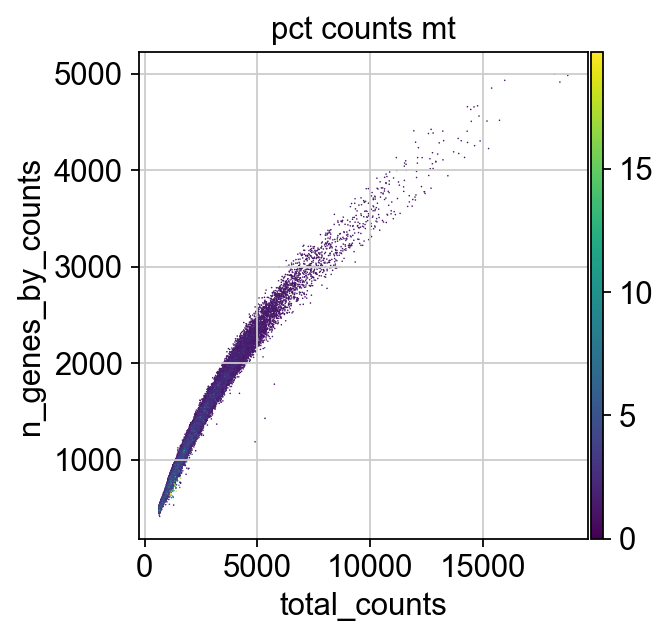

In [8]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')


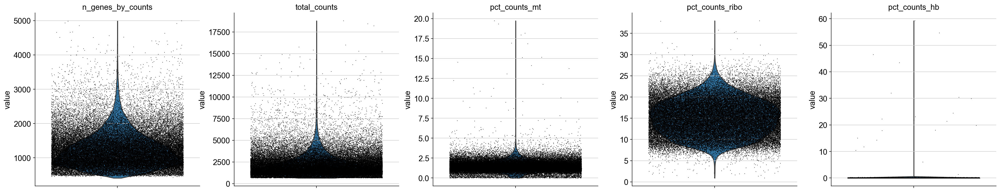

In [9]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt' , 'pct_counts_ribo', 'pct_counts_hb'],
             jitter=0.4, multi_panel=True)

These analysis indicate that  we can filter out cells with more that 3000 genes by count. It seems also typical to filter out cells with more that 5% of mitocondrial genes expressed. The scatter plot approves that the cells with more than 5% mt genes expressed have less total counts that other cells. 

We perform some additional basic quality control filtering to remove genes/cells based on the following criteria:

Remove genes expressed in fewer than 3 cells
Remove cells with more than 5% mitochondrial reads
Remove cells with outlying number of UMI counts per cell (outside the range of mean  ±  3  ×  standard deviation)
Remove cells expressing fewer than 200 genes

In [10]:
adata.obs['total_counts_log'] = np.log10(adata.obs['total_counts'])


 Calculate mean and standard deviation for filtering


In [11]:
sd_counts = np.std(adata.obs['total_counts_log'])
mean_counts = np.mean(adata.obs['total_counts_log'])

Filter cells with counts outside mean ± 3s.d.


In [12]:

max_counts_filter = mean_counts + 3*sd_counts
min_counts_filter = mean_counts - 3*sd_counts
counts_filter = np.logical_and(adata.obs['total_counts_log'] >= min_counts_filter,
                               adata.obs['total_counts_log'] <= max_counts_filter)
robomt_filter = np.logical_or(adata.obs['pct_counts_mt'] >= 5,
                               adata.obs['pct_counts_ribo'] <= 5)
robomthb_filter = np.logical_or(robomt_filter,adata.obs['pct_counts_hb'] >= 5)
robomthb_filter_keep= np.invert(robomthb_filter)                               

print('%d cells with extreme counts filtered' % (adata.X.shape[0] - np.sum(counts_filter)))
print("filtered %d cells with more than 5 percent mitochondrial reads" %(sum(adata.obs['pct_counts_mt'] >= 5)))
print("filtered %d cells with less than 5 percent ribosormal reads" %(sum(adata.obs['pct_counts_ribo'] <= 5)))
print("filtered %d cells with more than 5 percent hemoglobin reads" %(sum(adata.obs['pct_counts_hb'] >= 5)))

adata = adata[np.logical_and(robomthb_filter_keep, counts_filter), :]
nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')


adata = adata[adata.obs['n_genes_by_counts'] < 3000, :]

sc.pp.filter_cells(adata, min_genes=200)
nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')

sc.pp.filter_genes(adata, min_cells=3)



257 cells with extreme counts filtered
filtered 102 cells with more than 5 percent mitochondrial reads
filtered 93 cells with less than 5 percent ribosormal reads
filtered 20 cells with more than 5 percent hemoglobin reads
Data has 27998 genes in 59923 cells


Trying to set attribute `.obs` of view, copying.


Data has 27998 genes in 59693 cells
filtered out 9778 genes that are detected in less than 3 cells


 See how many cells and genes left after filtering


In [13]:
nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')

Data has 18220 genes in 59693 cells


Identify highest expressed genes to filter genes which are highly expressed in all cells.

normalizing counts per cell
    finished (0:00:00)


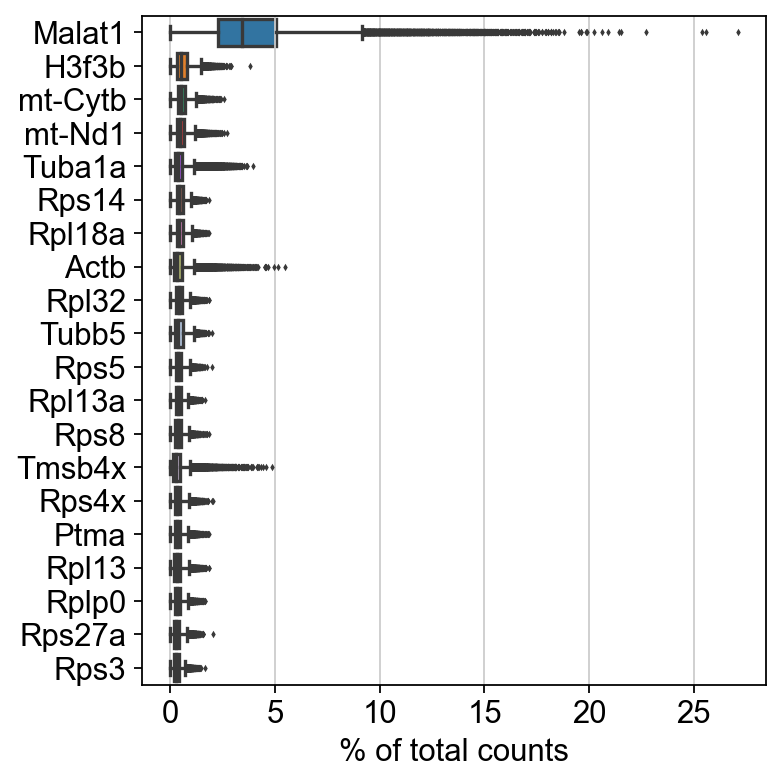

Trying to set attribute `.obs` of view, copying.


In [14]:
sc.pl.highest_expr_genes(adata, n_top=20)


malat1_gene = adata.var_names.str.startswith('Malat1')


mito_genes = adata.var_names.str.startswith('mt-')
hb_genes = adata.var_names.str.startswith(("Hba","Hbb","Hbq"))
remove = np.add(mito_genes, malat1_gene)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]
sc.pp.filter_cells(adata, min_genes=1)



After removig Malat1 gene,

normalizing counts per cell
    finished (0:00:00)


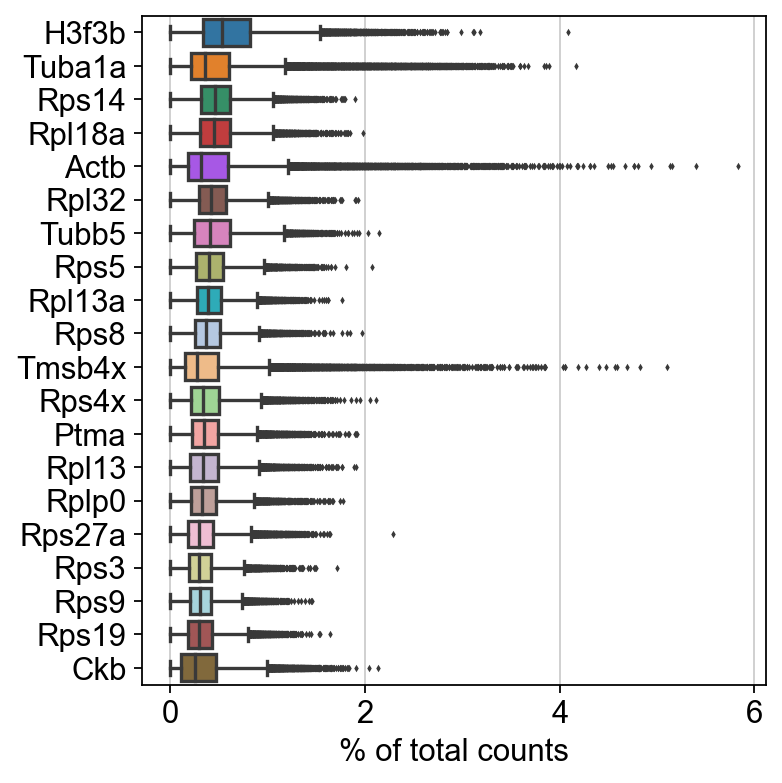

Data has 18201 genes in 59693 cells


In [15]:
sc.pl.highest_expr_genes(adata, n_top=20)

# See how many cells and genes left after filtering
nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')

Calculate QC metrics again after filtering,

In [16]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)


## Normalisation and Logarithmize


In [17]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

# Logarithmize the data:
sc.pp.log1p(adata) # log(X+1)
adata.raw = adata


normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


## Identifying highly variable genes


filter to only include highly variable genes.

extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


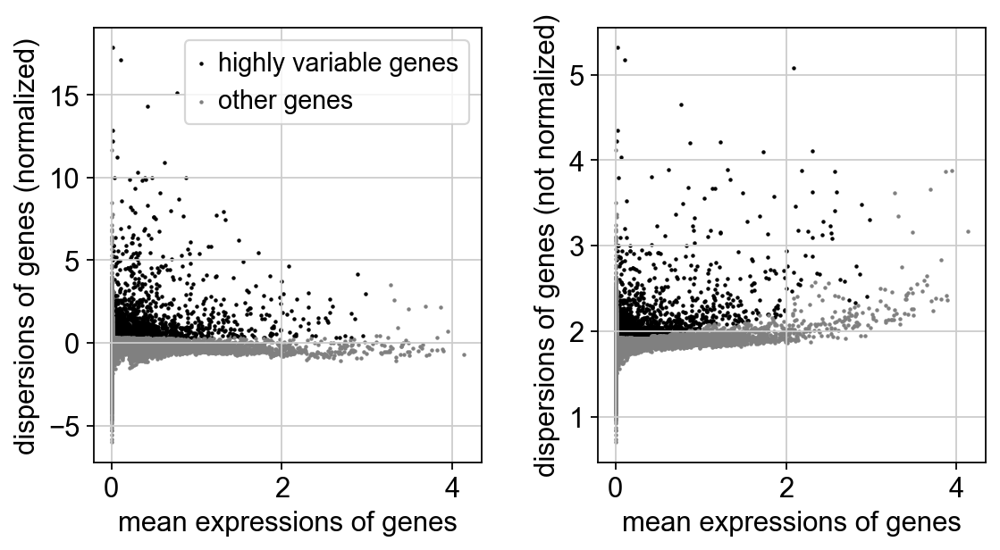

Data has 2217 genes in 59693 cells


In [18]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3.0, min_disp=0.3)

sc.pl.highly_variable_genes(adata)
#filter to only include HVGs

adata = adata[:, adata.var.highly_variable]

print('Data has', adata.n_vars, 'genes in', adata.n_obs, 'cells')

## Dimensionality reduction


Colormap for plotting


In [19]:
cmap = LinearSegmentedColormap.from_list(name='gene_cmap', colors=['lightgrey', 'thistle', 'red', 'darkred'])


### Calculate PCA

Reduce the dimensionality of the data by running principal component analysis (PCA), which reveals the main axes of variation and denoises the data. 

Scale to unit variance for PCA, and clip values exceeding variance 10.

In [20]:

sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)  # need to redo normalization after filtering
sc.pp.log1p(adata)  # log transform: X = log(X + 1)
sc.pp.scale(adata,max_value=10)
sc.tl.pca(adata, svd_solver='arpack')


normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:13)


Inspect the contribution of single PCs to the total variance in the data. This gives us information about how many PCs we should consider in order to compute the neighborhood relations of cells, e.g. used in the clustering function sc.tl.louvain() or UMAP sc.tl.umap(). Often, a rough estimate of the number of PCs does fine. 

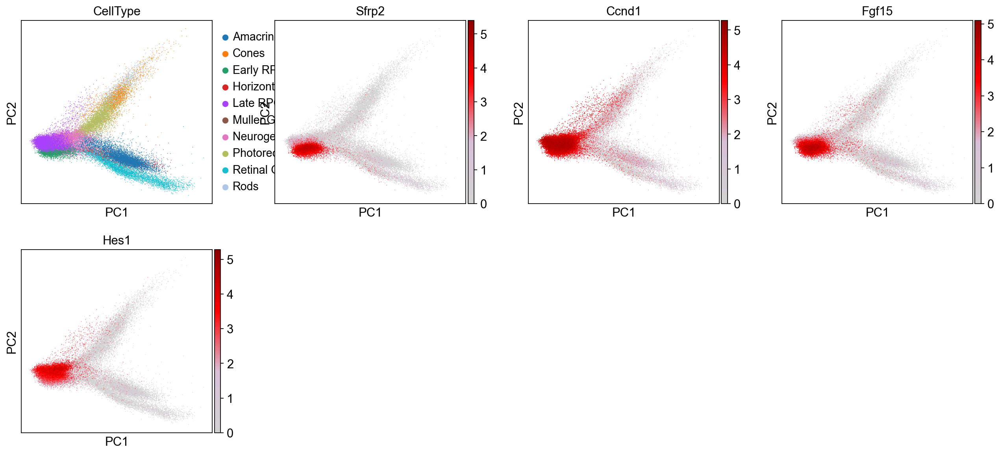

In [21]:
# Plot
sc.pl.pca_scatter(adata, color=['CellType', 'Sfrp2', 'Ccnd1', 'Fgf15', 'Hes1'], color_map=cmap)

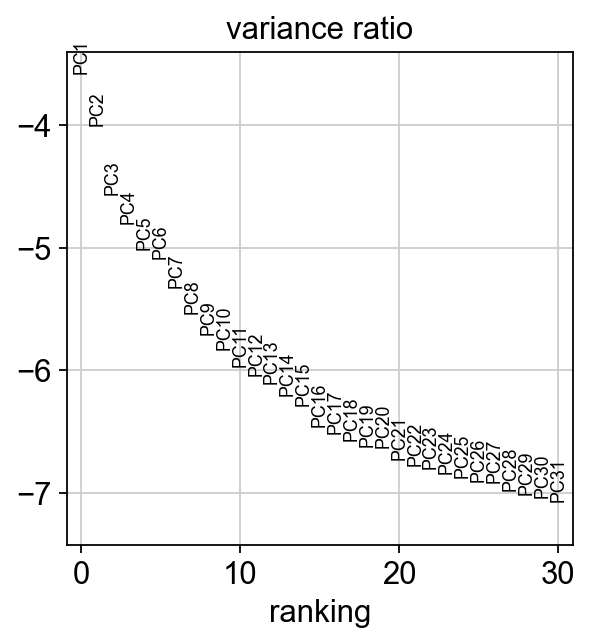

In [22]:
sc.pl.pca_variance_ratio(adata, log=True)


## Compute the neighborhood graph


Next we compute the neighborhood graph of cells using the PCA representation of the data matrix. Number of principal components used here (n_pcs=24).

In [23]:
sc.pp.neighbors(adata, n_neighbors=25, n_pcs=24)


computing neighbors
    using 'X_pca' with n_pcs = 24
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)


## Cluster the neighborhood graph 


There are many algorithms for clustering cells, and while they have been compared in detail in various benchmarks. Here we demonstrate clustering using Louvain clustering, which is a popular method for clustering single-cell RNA-seq data. 

Note that Louvain clustering directly clusters the neighborhood graph of cells, which we already computed in the previous section.

In [24]:
sc.tl.louvain(adata, resolution=0.4, random_state=0)


running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 10 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:23)


Visualizing data with umap


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:57)


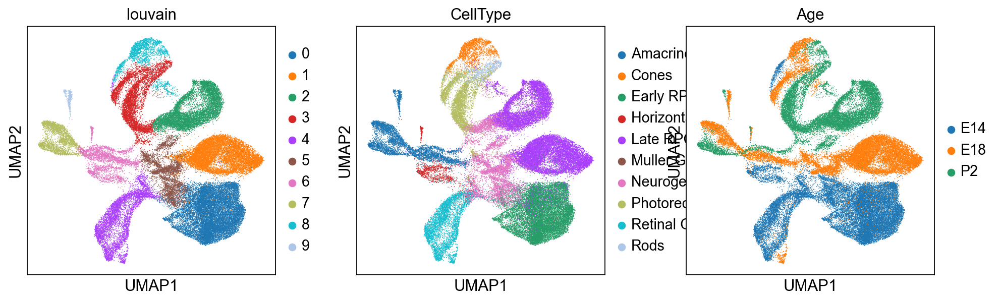

The CellType Rand index is 0.65
The Age Rand index is 0.45


In [25]:
sc.tl.umap(adata, min_dist=0.5, spread=1.0, random_state=1, n_components=2)

sc.pl.umap(adata, color= ['louvain','CellType', 'Age'])

rand_index = adjusted_rand_score(labels_true = adata.obs['CellType'], labels_pred = adata.obs['louvain'])
rand_index_age = adjusted_rand_score(labels_true = adata.obs['Age'], labels_pred = adata.obs['louvain'])
print('The CellType Rand index is', round(rand_index, 2))
print('The Age Rand index is', round(rand_index_age, 2))


Showing similarities between clusters obtained by lovain algotithm and cell types import along with the data

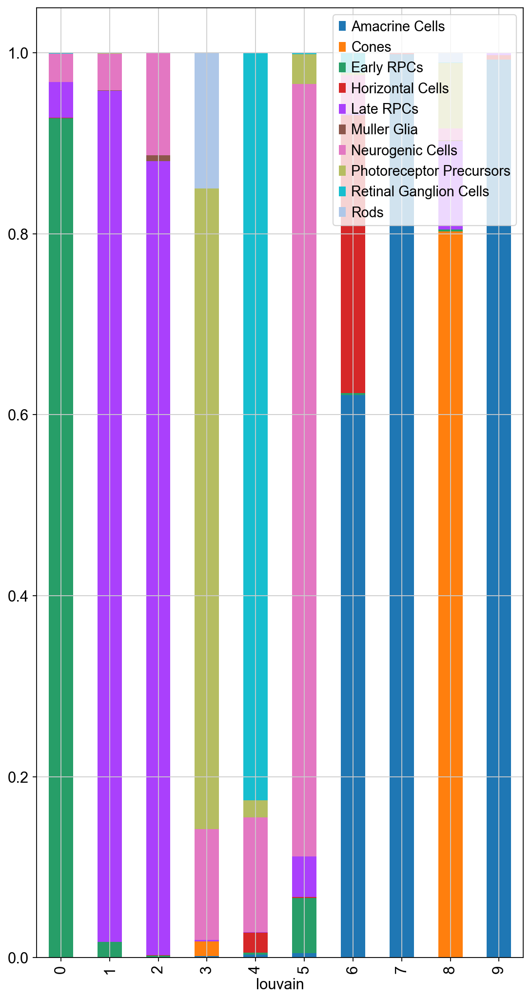

In [26]:
tmp = pd.crosstab(adata.obs['louvain'],adata.obs['CellType'], normalize='index')
sc.settings.set_figure_params(dpi=80,figsize=(8, 16), facecolor='white')

tmp.plot.bar(stacked=True).legend(loc='upper right')
sc.settings.set_figure_params(dpi=80, facecolor='white')



Changing cluster names of louvain clustering scheme based on their similarity with original cell types, 

C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\pandas\core\arrays\categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


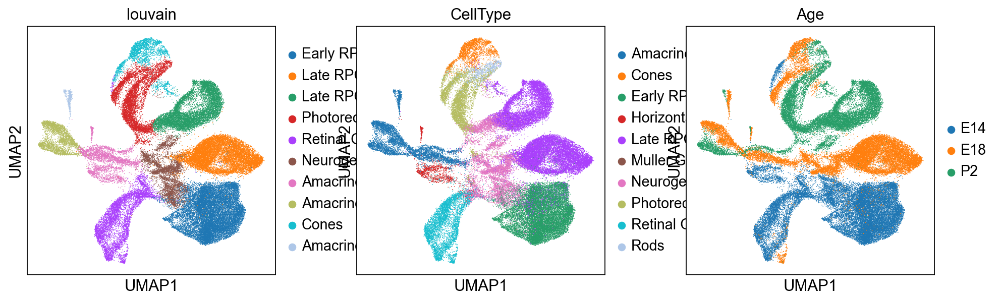

In [27]:

aaa=np.array(tmp)
aai=np.argmax(aaa,axis=1)
louvain_ctype_labels=cmake_unique(adata.obs.CellType.cat.categories[aai])

adata.rename_categories('louvain', louvain_ctype_labels)
sc.pl.umap(adata, color= ['louvain','CellType', 'Age'])


Showing similarities between clusters obtained by lovain algotithm and age groupss imported along with the data

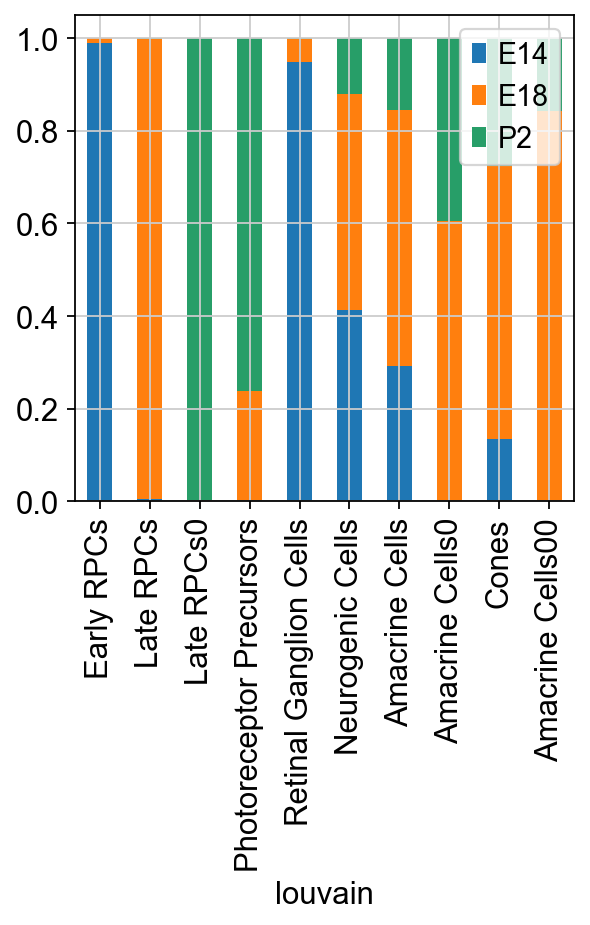

In [28]:
tmp = pd.crosstab(adata.obs['louvain'],adata.obs['Age'], normalize='index')

tmp.plot.bar(stacked=True).legend(loc='upper right')


Compute number of cells in each lovain cluster group, and also in each cell type category

In [29]:
n_genes=25

cluster_distrib = adata.obs.groupby("louvain").count()["n_genes"]
celltype_distrib = adata.obs.groupby("CellType").count()["n_genes"]


for c in cluster_distrib.index:
    print(
        "Cluster %s (%d cells):"
        % (
            c,
            cluster_distrib[c],
        )
    )


Cluster Early RPCs (15742 cells):
Cluster Late RPCs (11202 cells):
Cluster Late RPCs0 (8083 cells):
Cluster Photoreceptor Precursors (6010 cells):
Cluster Retinal Ganglion Cells (5645 cells):
Cluster Neurogenic Cells (4277 cells):
Cluster Amacrine Cells (3245 cells):
Cluster Amacrine Cells0 (2864 cells):
Cluster Cones (2209 cells):
Cluster Amacrine Cells00 (416 cells):


In [30]:

for ct in adata.obs.CellType.cat.categories:
    print(
        "CellType %s (%d cells):"
        % (
            ct,
            celltype_distrib[ct],
        )
    )  

CellType Amacrine Cells (5346 cells):
CellType Cones (1876 cells):
CellType Early RPCs (15093 cells):
CellType Horizontal Cells (1139 cells):
CellType Late RPCs (18679 cells):
CellType Muller Glia (60 cells):
CellType Neurogenic Cells (7139 cells):
CellType Photoreceptor Precursors (4678 cells):
CellType Retinal Ganglion Cells (4755 cells):
CellType Rods (928 cells):


## Calculate diffusion maps

Identifying and removing cell cycle effect
In diffusion map, strange loop shape can imply needing to recompute dimensionality reduction on the dataset with cell cycle genes removed. We don't perform this analysis on our dataset, but it seems it may be necessary. 


computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9984421  0.99754316 0.9972461  0.99686545 0.9935752
     0.9928401  0.9920645  0.9907737  0.98848283 0.98754114 0.9853164
     0.98477674 0.9816332  0.9802545 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:04)


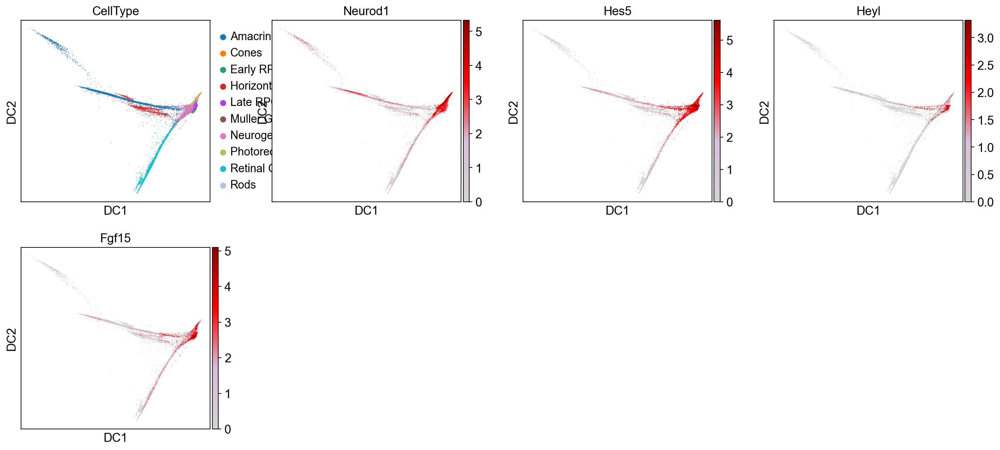

In [31]:
sc.tl.diffmap(adata)

sc.pl.diffmap(adata, color=['CellType', 'Neurod1', 'Hes5', 'Heyl', 'Fgf15'], color_map=cmap)

## find marker genes


A key aspect of annotating a cell atlas is identifying "marker genes". These are genes specific to individual clusters that "mark" them, and are important both for assigning functions to cell clusters, and for designing downstream experiments to probe activity of clusters. Once we have done clustering, let's compute a ranking for the highly differential genes in each cluster.

A gene marker analysis begins with ranking genes in each cluster according to how different they are relative to other clusters. The default method to compute differential expression is the t-test_overestim_var. Other implemented methods are: logreg, t-test and wilcoxon.  Here we compute ranking for differential genes in each cluster using wilcoxon rank-sum. 

By default, the .raw attribute of AnnData is used in case it has been initialized, it can be changed by setting use_raw=False.


method='wilcoxon', group_by='louvain'


ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:19)


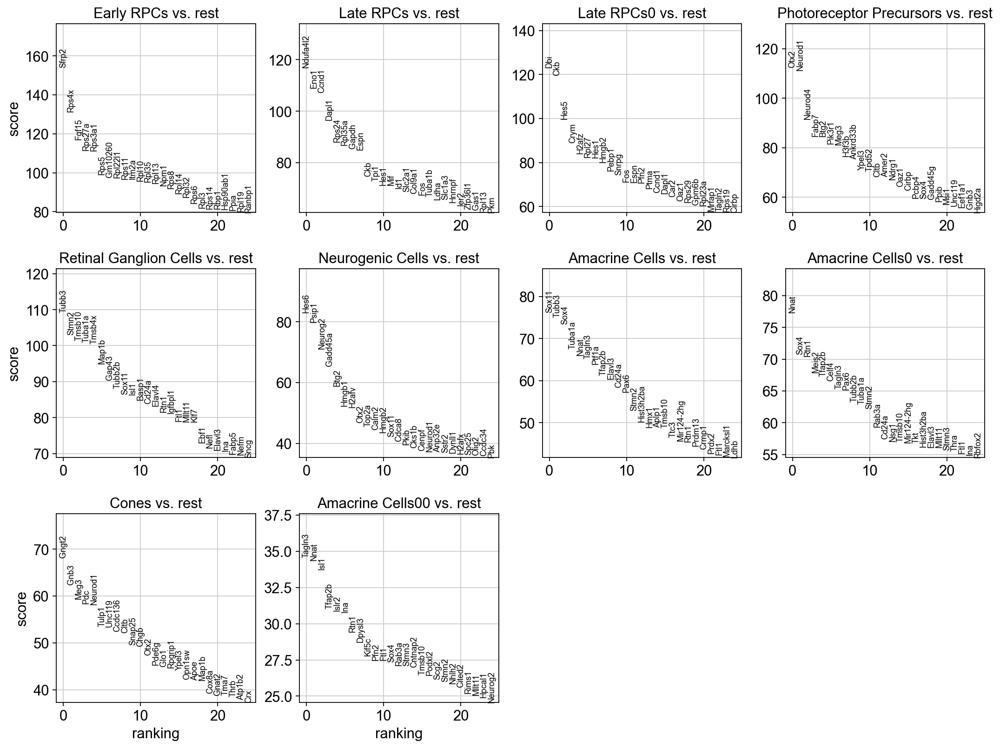

In [32]:
sc.tl.rank_genes_groups(adata, 'louvain' ,n_genes=n_genes, method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon")



method='wilcoxon', group_by='CellType'


ranking genes
    finished: added to `.uns['wilcoxon_CellType']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:18)


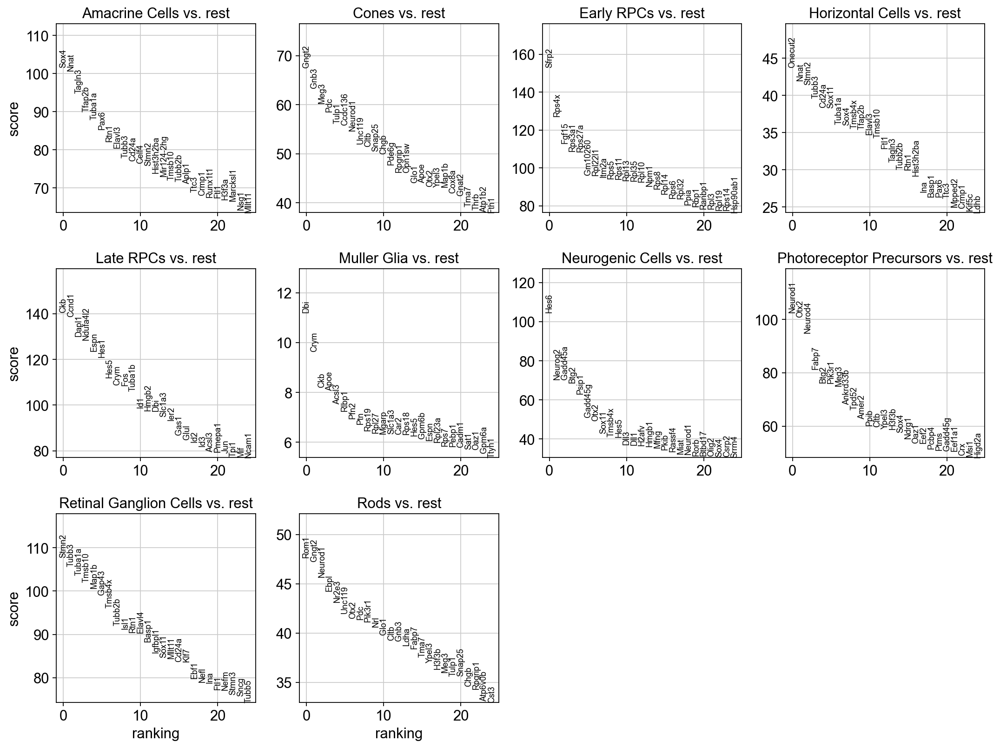

In [33]:
sc.tl.rank_genes_groups(adata, 'CellType' ,n_genes=n_genes, method='wilcoxon', key_added = "wilcoxon_CellType")
sc.pl.rank_genes_groups(adata, n_genes=n_genes, sharey=False, key = "wilcoxon_CellType")


method='wilcoxon', group_by='Age'


ranking genes
    finished: added to `.uns['wilcoxon_Age']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:09)


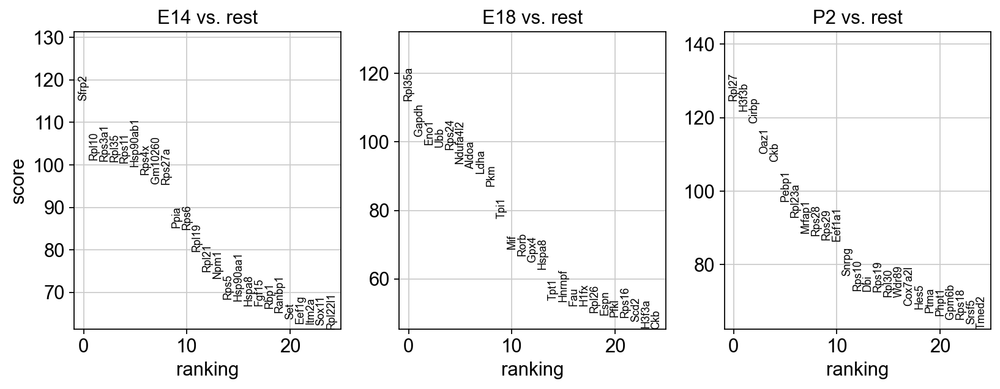

In [34]:

sc.tl.rank_genes_groups(adata, 'Age' ,n_genes=n_genes, method='wilcoxon', key_added = "wilcoxon_Age")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon_Age")

Visualization
There are several ways to visualize the expression of top DE genes. Here we will plot top 5 genes per cluster from Wilcoxon test as heatmap, dotplot, violin plot or matrix.

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


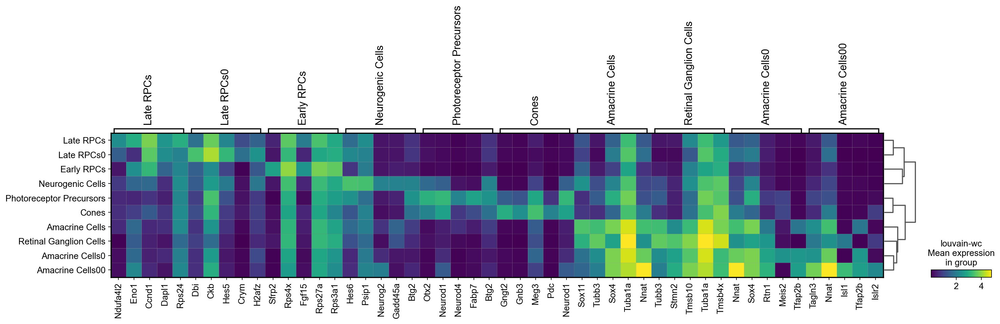

In [35]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon", groupby="louvain", colorbar_title ='louvain-wc\nMean expression\nin group')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_CellType']`


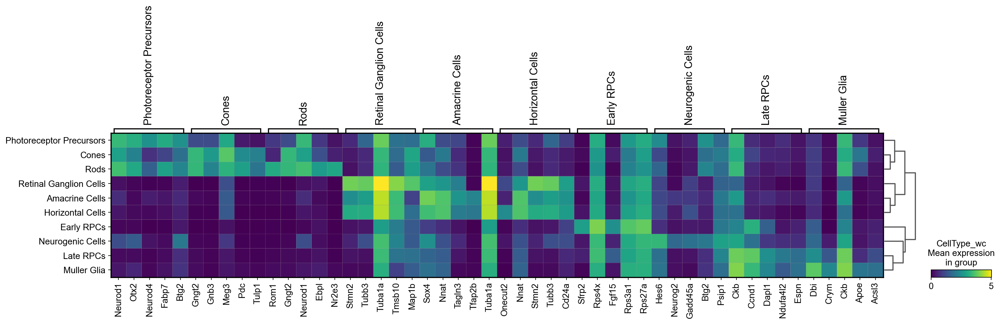

In [36]:

sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon_CellType", groupby="CellType", colorbar_title ='CellType_wc\nMean expression\nin group')

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Age']`


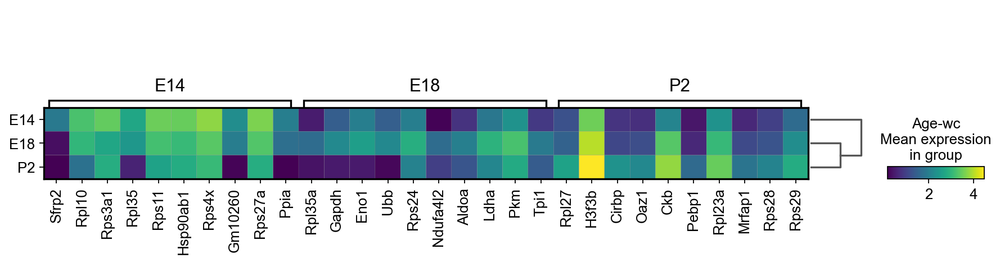

In [37]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=10, key="wilcoxon_Age", groupby="Age", colorbar_title ='Age-wc\nMean expression\nin group')

Show the 5 top ranked genes per cluster in a dataframe.

In [38]:
pd.DataFrame(adata.uns['wilcoxon']['names']).head(5)


,Early RPCs,Late RPCs,Late RPCs0,Photoreceptor Precursors,Retinal Ganglion Cells,Neurogenic Cells,Amacrine Cells,Amacrine Cells0,Cones,Amacrine Cells00
0,Sfrp2,Ndufa4l2,Dbi,Otx2,Tubb3,Hes6,Sox11,Nnat,Gngt2,Tagln3
1,Rps4x,Eno1,Ckb,Neurod1,Stmn2,Psip1,Tubb3,Sox4,Gnb3,Nnat
2,Fgf15,Ccnd1,Hes5,Neurod4,Tmsb10,Neurog2,Sox4,Rtn1,Meg3,Isl1
3,Rps27a,Dapl1,Crym,Fabp7,Tuba1a,Gadd45a,Tuba1a,Meis2,Pdc,Tfap2b
4,Rps3a1,Rps24,H2afz,Btg2,Tmsb4x,Btg2,Nnat,Tfap2b,Neurod1,Islr2


In [39]:
pd.DataFrame(adata.uns['wilcoxon_CellType']['names']).head(5)


,Amacrine Cells,Cones,Early RPCs,Horizontal Cells,Late RPCs,Muller Glia,Neurogenic Cells,Photoreceptor Precursors,Retinal Ganglion Cells,Rods
0,Sox4,Gngt2,Sfrp2,Onecut2,Ckb,Dbi,Hes6,Neurod1,Stmn2,Rom1
1,Nnat,Gnb3,Rps4x,Nnat,Ccnd1,Crym,Neurog2,Otx2,Tubb3,Gngt2
2,Tagln3,Meg3,Fgf15,Stmn2,Dapl1,Ckb,Gadd45a,Neurod4,Tuba1a,Neurod1
3,Tfap2b,Pdc,Rps3a1,Tubb3,Ndufa4l2,Apoe,Btg2,Fabp7,Tmsb10,Ebpl
4,Tuba1a,Tulp1,Rps27a,Cd24a,Espn,Acsl3,Psip1,Btg2,Map1b,Nr2e3


In [40]:
pd.DataFrame(adata.uns['wilcoxon_Age']['names']).head(10)  

,E14,E18,P2
0,Sfrp2,Rpl35a,Rpl27
1,Rpl10,Gapdh,H3f3b
2,Rps3a1,Eno1,Cirbp
3,Rpl35,Ubb,Oaz1
4,Rps11,Rps24,Ckb
5,Hsp90ab1,Ndufa4l2,Pebp1
6,Rps4x,Aldoa,Rpl23a
7,Gm10260,Ldha,Mrfap1
8,Rps27a,Pkm,Rps28
9,Ppia,Tpi1,Rps29


Marker genes without using raw data


ranking genes
    finished: added to `.uns['rfwilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\scanpy\tools\_rank_genes_groups.py:421: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


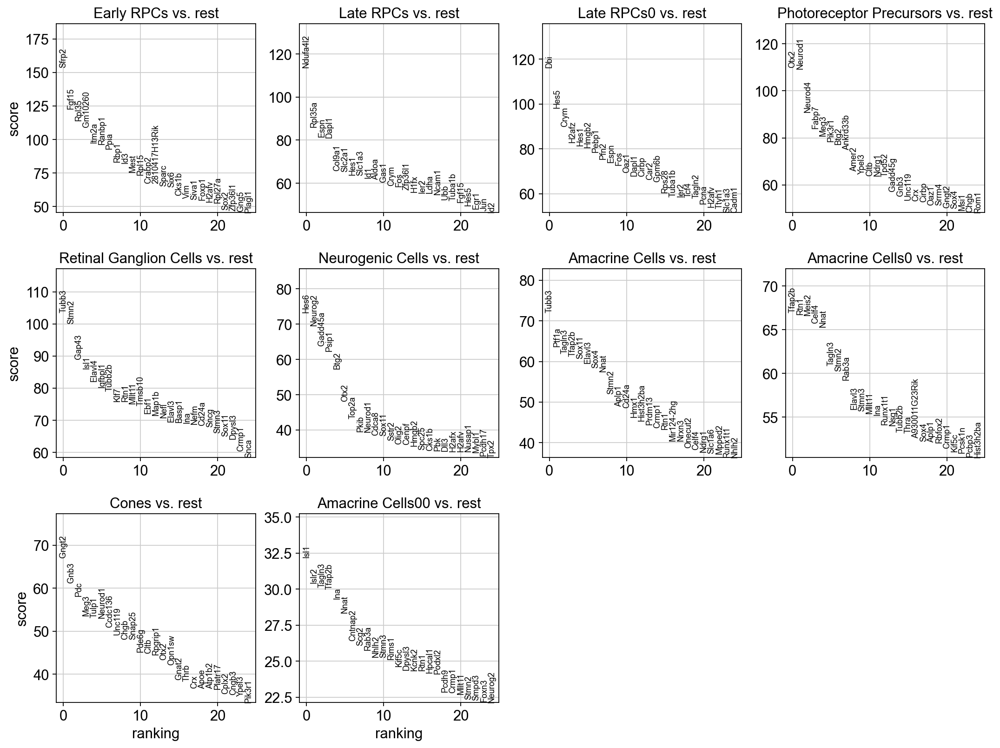

In [41]:
sc.tl.rank_genes_groups(adata, 'louvain' ,n_genes=n_genes, method='wilcoxon',use_raw=False, key_added = "rfwilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "rfwilcoxon")     


ranking genes
    finished: added to `.uns['rfwilcoxon_CellType']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)


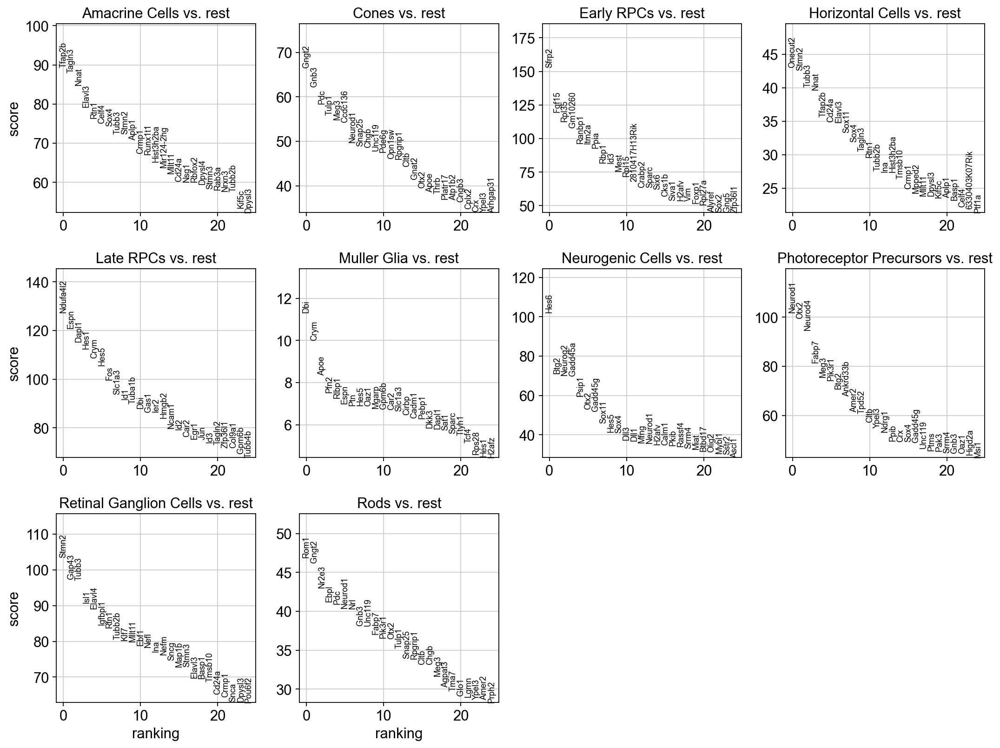

In [42]:
sc.tl.rank_genes_groups(adata, 'CellType' ,n_genes=n_genes, method='wilcoxon',use_raw=False, key_added = "rfwilcoxon_CellType")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "rfwilcoxon_CellType")  

ranking genes
    finished: added to `.uns['rfwilcoxon_Age']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


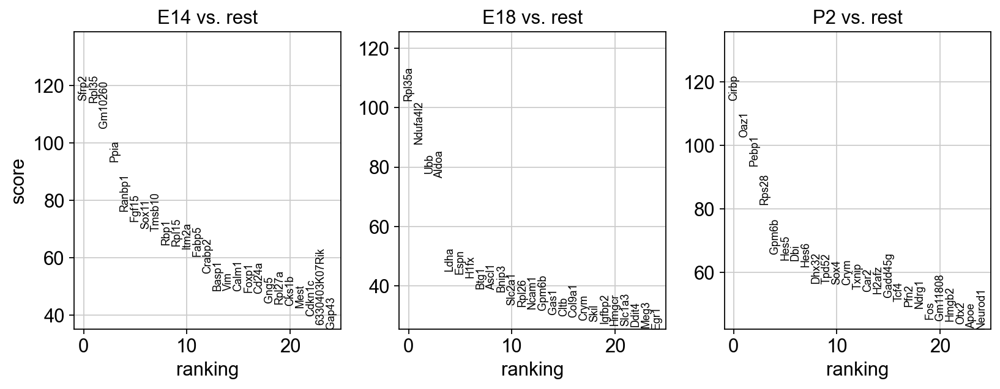

In [43]:
sc.tl.rank_genes_groups(adata, 'Age' ,n_genes=n_genes, method='wilcoxon',use_raw=False, key_added = "rfwilcoxon_Age")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "rfwilcoxon_Age")  


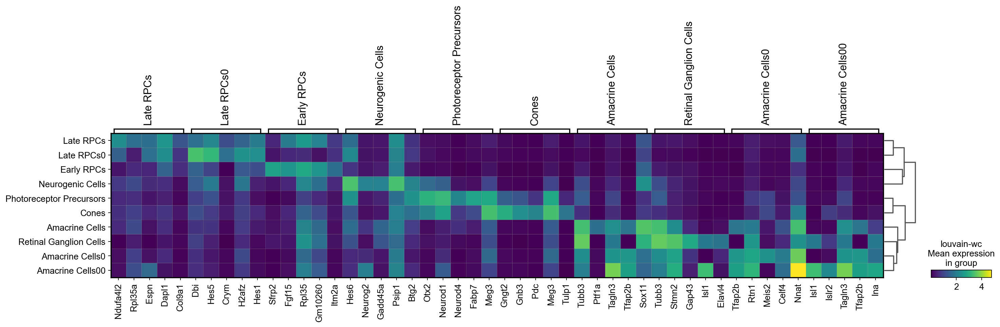

In [44]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="rfwilcoxon", groupby="louvain", colorbar_title ='louvain-wc\nMean expression\nin group')

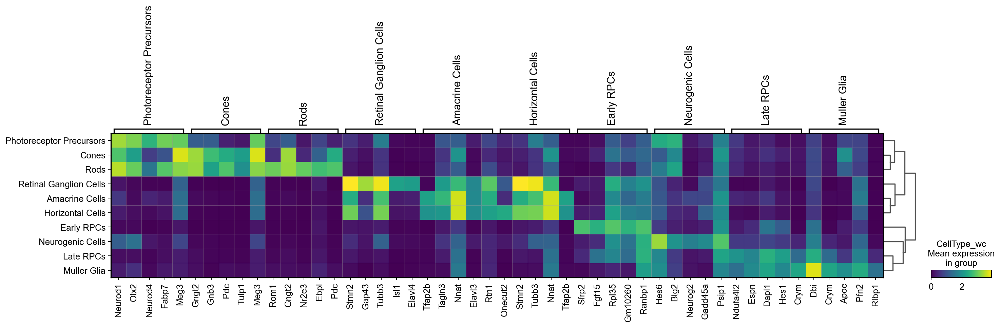

In [45]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="rfwilcoxon_CellType", groupby="CellType", colorbar_title ='CellType_wc\nMean expression\nin group')

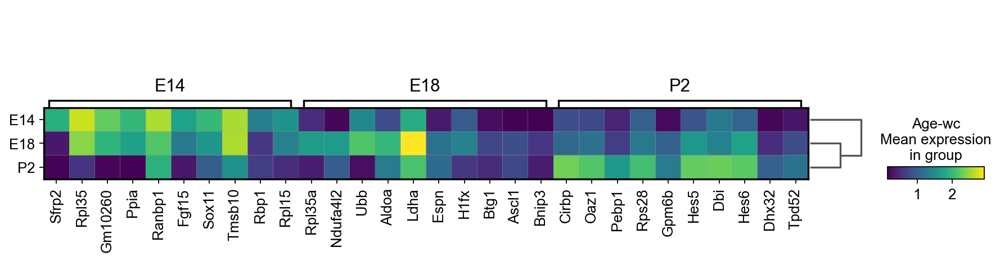

In [46]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=10, key="rfwilcoxon_Age", groupby="Age", colorbar_title ='Age-wc\nMean expression\nin group')

In [47]:
pd.DataFrame(adata.uns['rfwilcoxon']['names']).head(10)


,Early RPCs,Late RPCs,Late RPCs0,Photoreceptor Precursors,Retinal Ganglion Cells,Neurogenic Cells,Amacrine Cells,Amacrine Cells0,Cones,Amacrine Cells00
0,Sfrp2,Ndufa4l2,Dbi,Otx2,Tubb3,Hes6,Tubb3,Tfap2b,Gngt2,Isl1
1,Fgf15,Rpl35a,Hes5,Neurod1,Stmn2,Neurog2,Ptf1a,Rtn1,Gnb3,Islr2
2,Rpl35,Espn,Crym,Neurod4,Gap43,Gadd45a,Tagln3,Meis2,Pdc,Tagln3
3,Gm10260,Dapl1,H2afz,Fabp7,Isl1,Psip1,Tfap2b,Celf4,Meg3,Tfap2b
4,Itm2a,Col9a1,Hes1,Meg3,Elavl4,Btg2,Sox11,Nnat,Tulp1,Ina
5,Ranbp1,Slc2a1,Hmgb2,Pik3r1,Igfbpl1,Otx2,Elavl3,Tagln3,Neurod1,Nnat
6,Ppia,Hes1,Pebp1,Btg2,Tubb2b,Top2a,Sox4,Stmn2,Ccdc136,Cntnap2
7,Rbp1,Slc1a3,Pfn2,Ankrd33b,Klf7,Pkib,Nnat,Rab3a,Unc119,Scg2
8,Id3,Id1,Espn,Amer2,Rtn1,Neurod1,Stmn2,Elavl3,Chgb,Rab3a
9,Mest,Aldoa,Fos,Ypel3,Mllt11,Cdca8,Aplp1,Stmn3,Snap25,Nhlh2


In [48]:
pd.DataFrame(adata.uns['rfwilcoxon_CellType']['names']).head(10)


,Amacrine Cells,Cones,Early RPCs,Horizontal Cells,Late RPCs,Muller Glia,Neurogenic Cells,Photoreceptor Precursors,Retinal Ganglion Cells,Rods
0,Tfap2b,Gngt2,Sfrp2,Onecut2,Ndufa4l2,Dbi,Hes6,Neurod1,Stmn2,Rom1
1,Tagln3,Gnb3,Fgf15,Stmn2,Espn,Crym,Btg2,Otx2,Gap43,Gngt2
2,Nnat,Pdc,Rpl35,Tubb3,Dapl1,Apoe,Neurog2,Neurod4,Tubb3,Nr2e3
3,Elavl3,Tulp1,Gm10260,Nnat,Hes1,Pfn2,Gadd45a,Fabp7,Isl1,Ebpl
4,Rtn1,Meg3,Ranbp1,Tfap2b,Crym,Rlbp1,Psip1,Meg3,Elavl4,Pdc
5,Celf4,Ccdc136,Itm2a,Cd24a,Hes5,Espn,Otx2,Pik3r1,Igfbpl1,Neurod1
6,Sox4,Neurod1,Ppia,Elavl3,Fos,Ptn,Gadd45g,Btg2,Rtn1,Nrl
7,Tubb3,Snap25,Rbp1,Sox11,Slc1a3,Hes5,Sox11,Ankrd33b,Tubb2b,Gnb3
8,Stmn2,Chgb,Id3,Sox4,Id1,Oaz1,Hes5,Amer2,Klf7,Unc119
9,Aplp1,Unc119,Mest,Tagln3,Tuba1b,Mgarp,Sox4,Tpd52,Mllt11,Fabp7


In [49]:
pd.DataFrame(adata.uns['rfwilcoxon_Age']['names']).head(10)

,E14,E18,P2
0,Sfrp2,Rpl35a,Cirbp
1,Rpl35,Ndufa4l2,Oaz1
2,Gm10260,Ubb,Pebp1
3,Ppia,Aldoa,Rps28
4,Ranbp1,Ldha,Gpm6b
5,Fgf15,Espn,Hes5
6,Sox11,H1fx,Dbi
7,Tmsb10,Btg1,Hes6
8,Rbp1,Ascl1,Dhx32
9,Rpl15,Bnip3,Tpd52


### Compare specific clusters
We can also do pairwise comparisons of individual clusters on one vs many clusters.



ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:41)


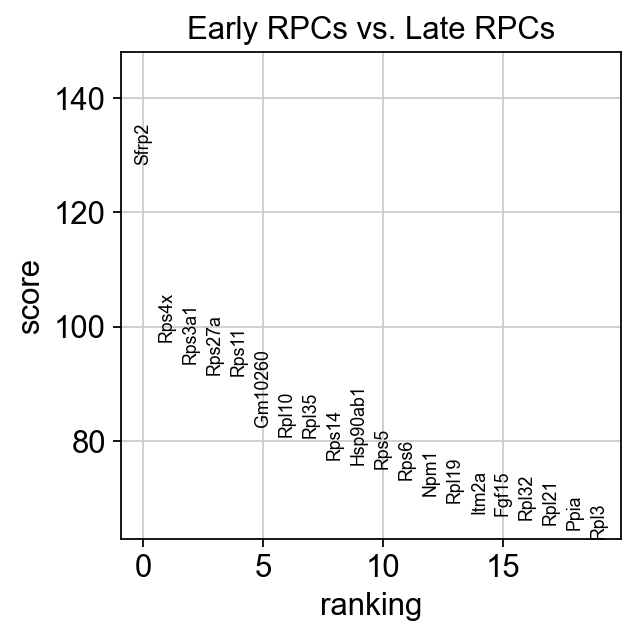

In [50]:
sc.tl.rank_genes_groups(adata, 'CellType', groups=['Early RPCs'], reference='Late RPCs', method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=['Early RPCs'], n_genes=20)

Plot as violins for those two groups.



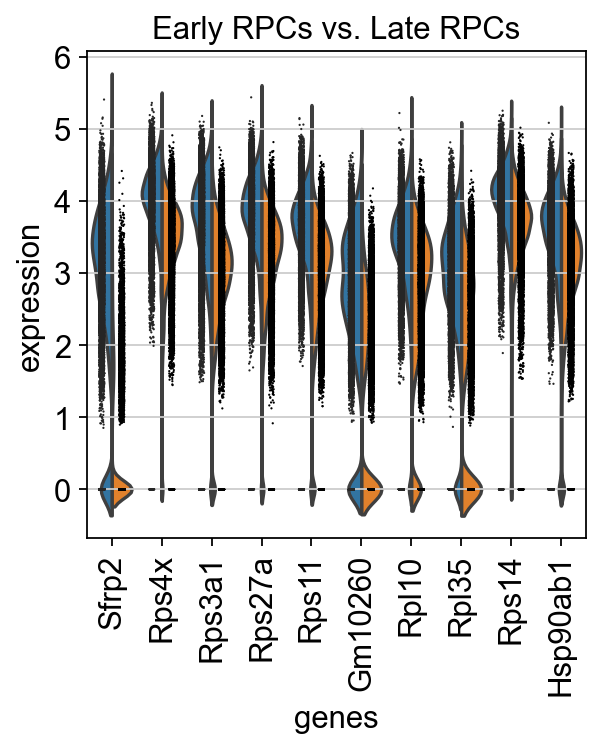

In [51]:
sc.pl.rank_genes_groups_violin(adata, groups='Early RPCs', n_genes=10)


Visualize the known marker genes in a matrixplot.

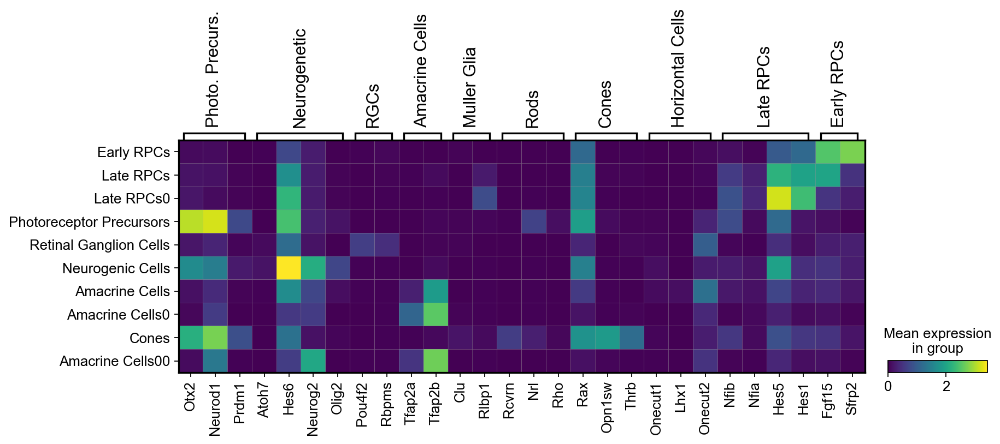

In [52]:
marker_genes = {
'Photo. Precurs.': ['Otx2','Neurod1','Prdm1'], 
'Neurogenetic': ['Atoh7','Hes6','Neurog2','Olig2'],
'RGCs': ['Pou4f2','Rbpms'],
'Amacrine Cells': ['Tfap2a','Tfap2b'],
'Muller Glia': ['Clu','Rlbp1'],
'Rods': ['Rcvrn','Nrl','Rho'],
'Cones': ['Rax','Opn1sw','Thrb'],
'Horizontal Cells': ['Onecut1','Lhx1','Onecut2'],
'Late RPCs': ['Nfib','Nfia','Hes5','Hes1'],
'Early RPCs': ['Fgf15','Sfrp2']
}

sc.pl.matrixplot(adata, marker_genes, groupby='louvain', use_raw=True)


# Analysis of SmartSeq data


The droplet-based 10X Genomics Chromium (10X) approach and the plate-based Smart-seq2 full-length method are two frequently used scRNA-seq platforms. [wang(21)](https://www.sciencedirect.com/science/article/pii/S1672022921000486)  thoroughly and systematicly compares their advantages and limitations. We won't go into details, but it seems main difference in our analysis on count matrices are just on how to set thresholds for performing basic filtering. 

In [53]:
results_file = 'swrite/retsmart.h5ad'  # the file that will store the analysis results


adata = sc.read_10x_mtx(
    'sdata',  # the directory with the `.mtx` file
    var_names='gene_symbols',                # use gene symbols for the variable names (variables-axis index)
    cache=True)                              # write a cache file for faster subsequent reading


genes= pd.read_csv('sdata/GSE118614_Smart_genes.tsv', header=0, sep='\t')


cells = pd.read_csv('sdata/GSE118614_Smart_cells.tsv', header=0, sep='\t')
adata.obs['CellType']=cells['CellType'].values
adata.obs['Age']=cells['Age'].values
adata.obs['Plate']=cells['Plate'].values


... reading from cache file cache\sdata-matrix.h5ad


 Calculate  mitochondrial genes, ribosormal genes, and hemoglobin genes content

In [54]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['ribo'] = adata.var_names.str.startswith(("Rps","Rpl"))
adata.var['hb'] = adata.var_names.str.startswith(("Hba","Hbb","Hbq"))

sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)

C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'CellType' as categorical
C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'Age' as categorical
C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\anndata\_core\anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reord

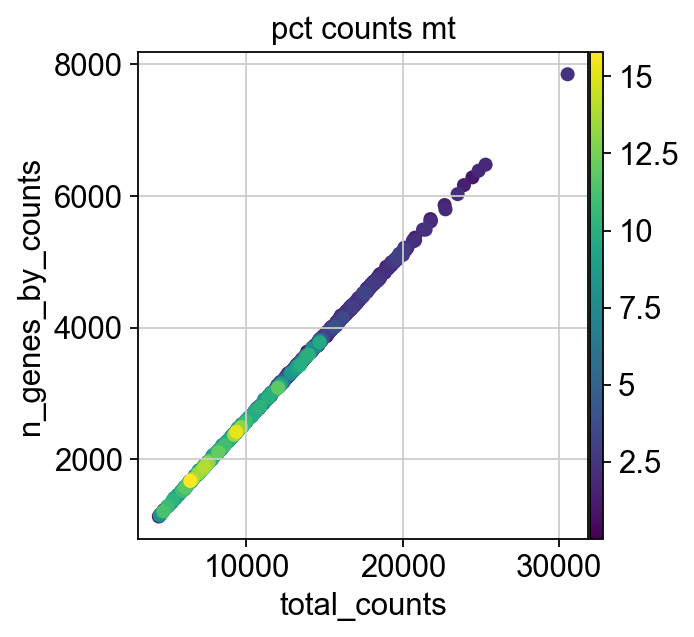

In [55]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts', color='pct_counts_mt')


In [56]:
print("filtered %d cells with more than 10 percent mitochondrial reads" %(sum(adata.obs['pct_counts_mt'] >= 10)))


filtered 40 cells with more than 10 percent mitochondrial reads


In [57]:
adata = adata[adata.obs['pct_counts_mt'] < 10, :]


In [58]:
adata = adata[adata.obs['n_genes_by_counts'] < 7000, :]

sc.pp.filter_cells(adata, min_genes=500)

adata_all_genes = adata.copy()
sc.pp.filter_genes(adata, min_cells=3)


Trying to set attribute `.obs` of view, copying.


filtered out 11889 genes that are detected in less than 3 cells


See how many cells and genes left after filtering


In [59]:
nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')

Data has 16557 genes in 706 cells


Delete unususally high expressed genes, along with mito ang homoglobin geses.

normalizing counts per cell
    finished (0:00:00)


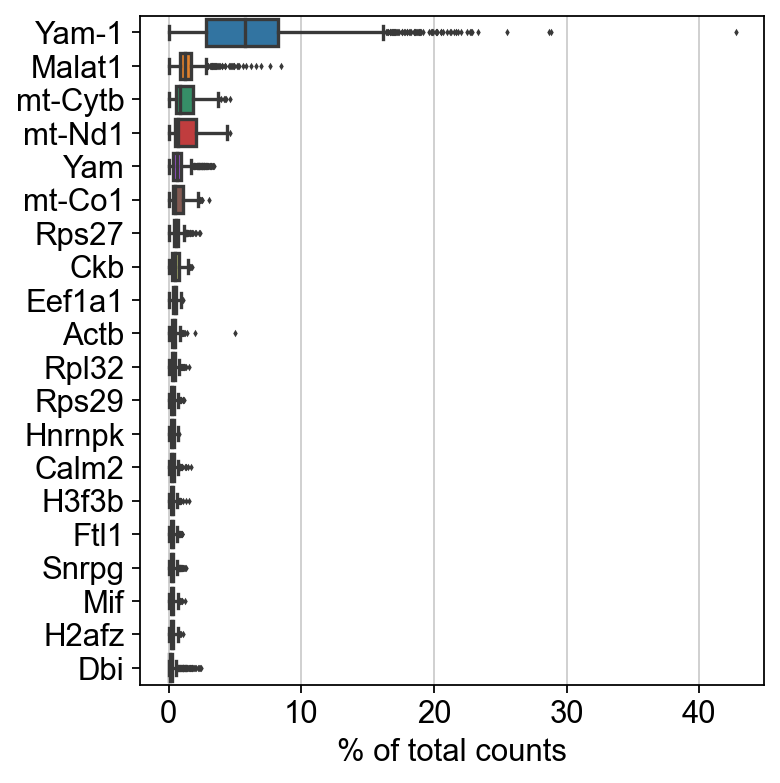

In [60]:
sc.pl.highest_expr_genes(adata, n_top=20)


In [61]:
malat1_gene = adata.var_names.str.startswith('Malat1')
yam_genes = adata.var_names.str.startswith('Yam')


mito_genes = adata.var_names.str.startswith('mt-')
hb_genes = adata.var_names.str.startswith(("Hba","Hbb","Hbq"))
remove = np.add(mito_genes, malat1_gene)
remove = np.add(remove, yam_genes)
remove = np.add(remove, hb_genes)
keep = np.invert(remove)

adata = adata[:,keep]
sc.pp.filter_cells(adata, min_genes=1)

Trying to set attribute `.obs` of view, copying.


normalizing counts per cell
    finished (0:00:00)


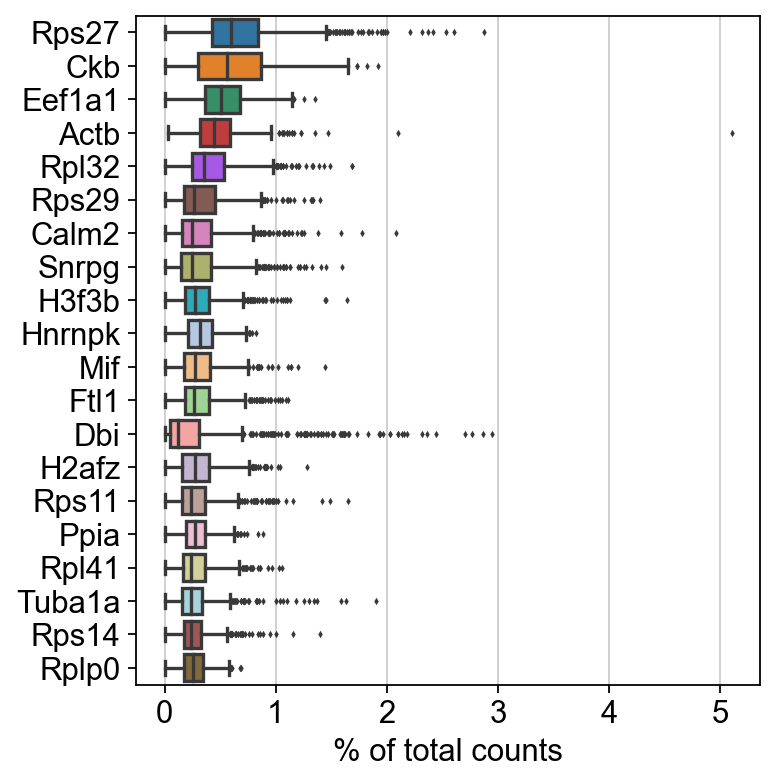

In [62]:
sc.pl.highest_expr_genes(adata, n_top=20)


In [63]:
# See how many cells and genes left after filtering
nCells = adata.X.shape[0]
nGenes = adata.X.shape[1]
print('Data has', nGenes, 'genes in', nCells, 'cells')


Data has 16534 genes in 706 cells


In [64]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt','ribo','hb'], percent_top=None, log1p=False, inplace=True)


## Normalisation and Logarithmize the data:



In [65]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)

sc.pp.log1p(adata) # log(X+1)
adata.raw = adata

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


## Identifying highly variable genes¶


extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


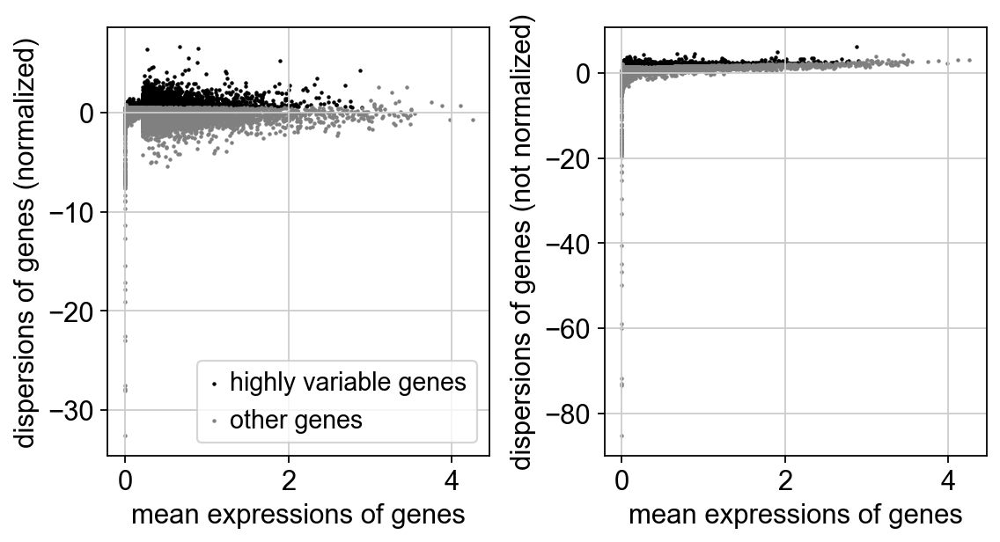

Data has 2632 genes in 706 cells


In [66]:

sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3.0, min_disp=0.5)

sc.pl.highly_variable_genes(adata)
#filter to only include HVGs

adata = adata[:, adata.var.highly_variable]

print('Data has', adata.n_vars, 'genes in', adata.n_obs, 'cells')

## Dimensionality reduction
### Calculate PCA


In [67]:

sc.pp.normalize_per_cell(adata,counts_per_cell_after=1e4)  # need to redo normalization after filtering
sc.pp.log1p(adata)  # log transform: X = log(X + 1)
sc.pp.scale(adata,max_value=10)
sc.tl.pca(adata, svd_solver='arpack')


normalizing by total count per cell


Trying to set attribute `.obs` of view, copying.


    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:00)


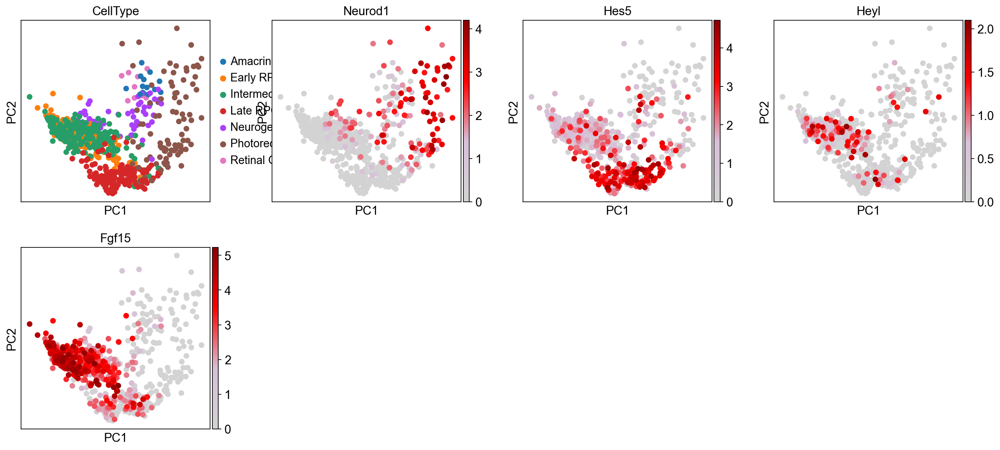

In [68]:
# Plot
sc.pl.pca_scatter(adata, color=['CellType', 'Neurod1', 'Hes5', 'Heyl', 'Fgf15'], color_map=cmap)


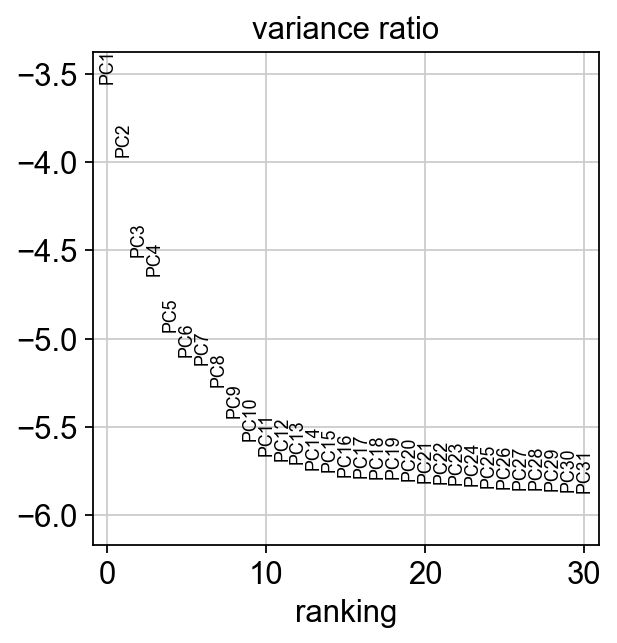

In [69]:
sc.pl.pca_variance_ratio(adata, log=True)


## Compute the neighborhood graph and perform clustering


computing neighbors
    using 'X_pca' with n_pcs = 22
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 8 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)


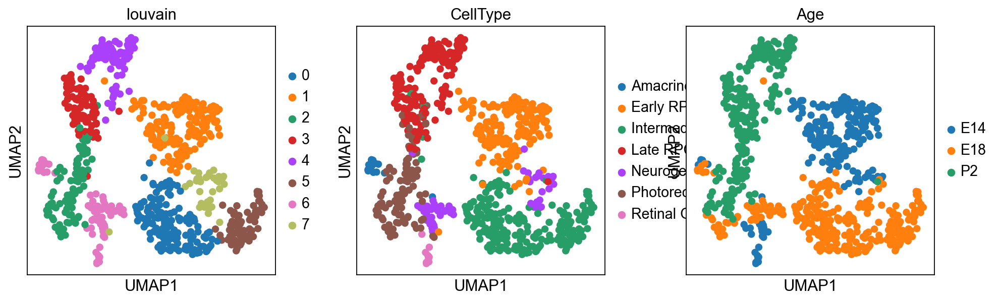

The CellType Rand index is 0.65
The Age Rand index is 0.43


In [70]:
sc.pp.neighbors(adata, n_neighbors=9, n_pcs=22)
sc.tl.louvain(adata, resolution=0.7, random_state=0)
sc.tl.umap(adata, min_dist=0.5, spread=1.0, random_state=1, n_components=2)
# Visualizing data with umap

sc.pl.umap(adata, color= ['louvain','CellType', 'Age'])

rand_index = adjusted_rand_score(labels_true = adata.obs['CellType'], labels_pred = adata.obs['louvain'])
rand_index_age = adjusted_rand_score(labels_true = adata.obs['Age'], labels_pred = adata.obs['louvain'])
print('The CellType Rand index is', round(rand_index, 2))
print('The Age Rand index is', round(rand_index_age, 2))

Compute number of cells in each subgroup, 

In [71]:
cluster_distrib = adata.obs.groupby("louvain").count()["n_genes"]
celltype_distrib = adata.obs.groupby("CellType").count()["n_genes"]


for c in cluster_distrib.index:
    print(
        "Cluster %s (%d cells):"
        % (
            c,
            cluster_distrib[c],
        )
    )


Cluster 0 (149 cells):
Cluster 1 (148 cells):
Cluster 2 (89 cells):
Cluster 3 (80 cells):
Cluster 4 (76 cells):
Cluster 5 (68 cells):
Cluster 6 (61 cells):
Cluster 7 (35 cells):


In [72]:
for ct in adata.obs.CellType.cat.categories:
    print(
        "CellType %s (%d cells):"
        % (
            ct,
            celltype_distrib[ct],
        )
    )  
    

CellType Amacrine Cells (15 cells):
CellType Early RPCs (156 cells):
CellType Intermediate RPCs (225 cells):
CellType Late RPCs (148 cells):
CellType Neurogenic Cells (52 cells):
CellType Photoreceptor Precursors (101 cells):
CellType Retinal Ganglion Cells (9 cells):


Similarities between the obtained lovain groups and import cell type, 

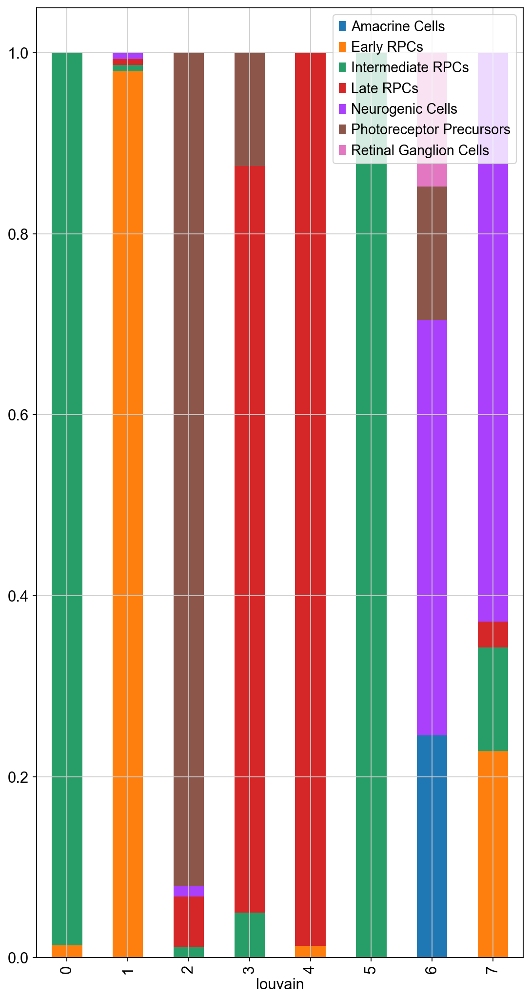

In [73]:
tmp = pd.crosstab(adata.obs['louvain'],adata.obs['CellType'], normalize='index')
sc.settings.set_figure_params(dpi=80,figsize=(8, 16), facecolor='white')

tmp.plot.bar(stacked=True).legend(loc='upper right')
sc.settings.set_figure_params(dpi=80, facecolor='white')


Rename louvain cell cluster labels to their similar groups in cell type grouping. 

C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\pandas\core\arrays\categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.rename_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


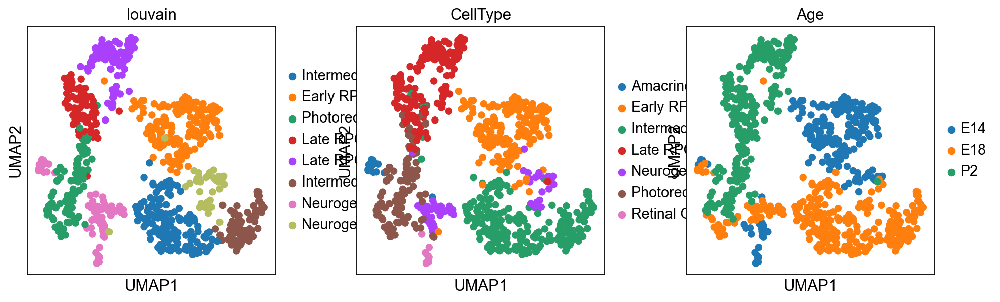

In [74]:
aaa=np.array(tmp)
aai=np.argmax(aaa,axis=1)
louvain_ctype_labels=cmake_unique(adata.obs.CellType.cat.categories[aai])

adata.rename_categories('louvain', louvain_ctype_labels)
sc.pl.umap(adata, color= ['louvain','CellType', 'Age'])


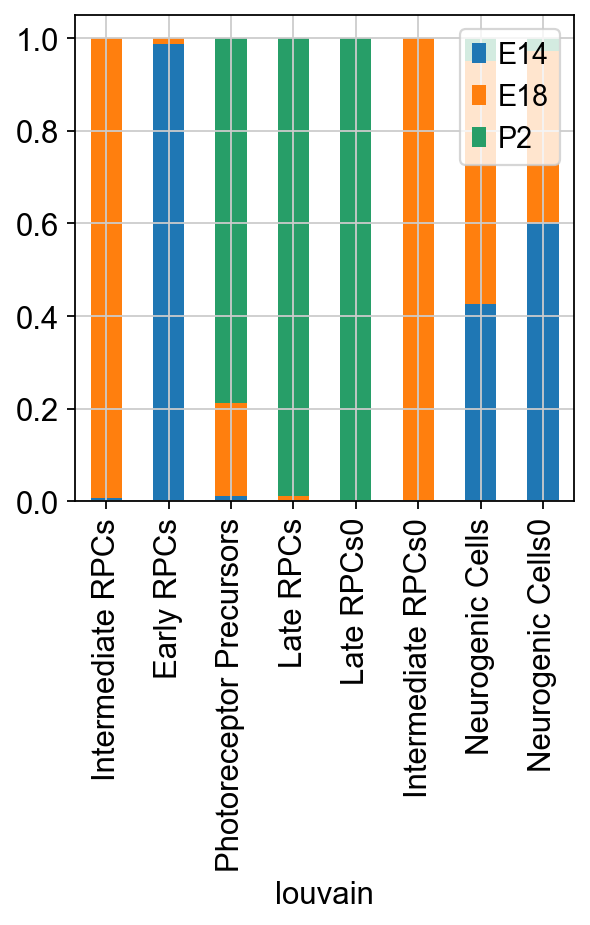

In [75]:
tmp = pd.crosstab(adata.obs['louvain'],adata.obs['Age'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper right')

## Calculate diffusion maps


computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.98652315 0.97614264 0.9634274  0.95697284 0.9547923
     0.94632727 0.9430687  0.925458   0.9116601  0.90291375 0.8949005
     0.88613504 0.86739784 0.8660263 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:00)


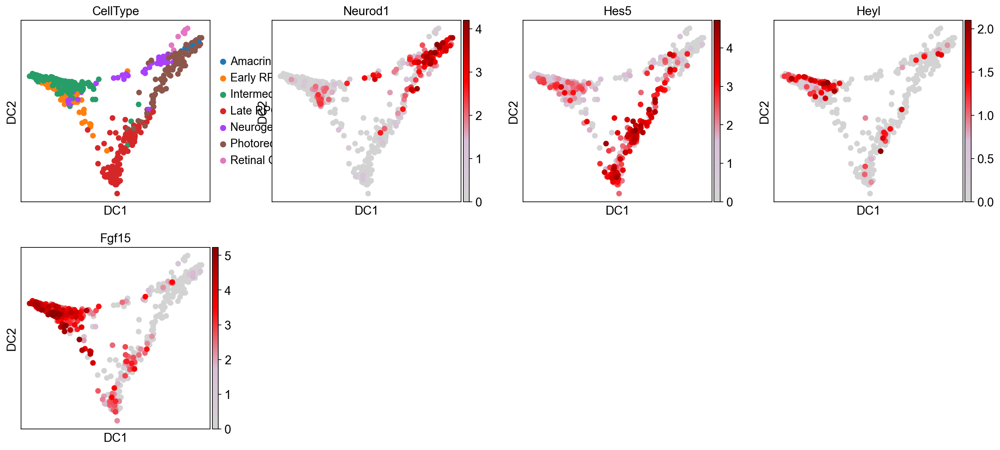

In [76]:
sc.tl.diffmap(adata)

sc.pl.diffmap(adata, color=['CellType', 'Neurod1', 'Hes5', 'Heyl', 'Fgf15'], color_map=cmap)

## find marker genes


method='wilcoxon', group_by='louvain'


ranking genes
    finished: added to `.uns['wilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:01)


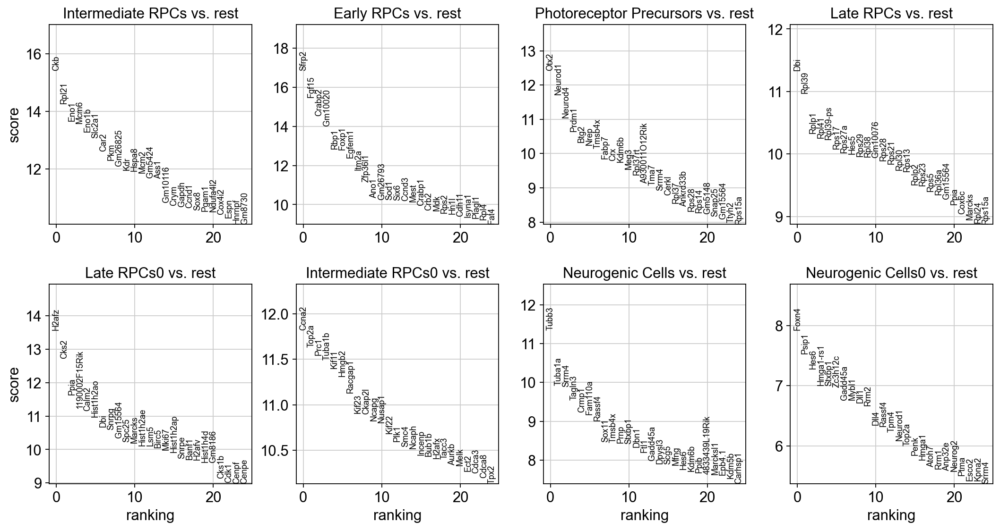

In [77]:
n_genes=25
sc.tl.rank_genes_groups(adata, 'louvain' ,n_genes=n_genes, method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon")


 method='wilcoxon', group_by='CellType'


ranking genes
    finished: added to `.uns['wilcoxon_CellType']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


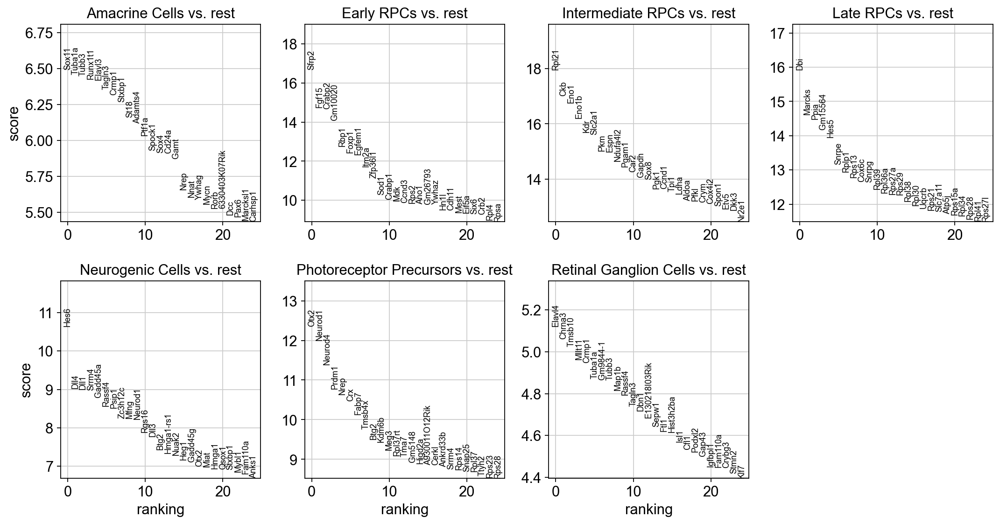

In [78]:
sc.tl.rank_genes_groups(adata, 'CellType' ,n_genes=n_genes, method='wilcoxon', key_added = "wilcoxon_CellType")
sc.pl.rank_genes_groups(adata, n_genes=n_genes, sharey=False, key = "wilcoxon_CellType")


method='wilcoxon', group_by='Age'


ranking genes
    finished: added to `.uns['wilcoxon_Age']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


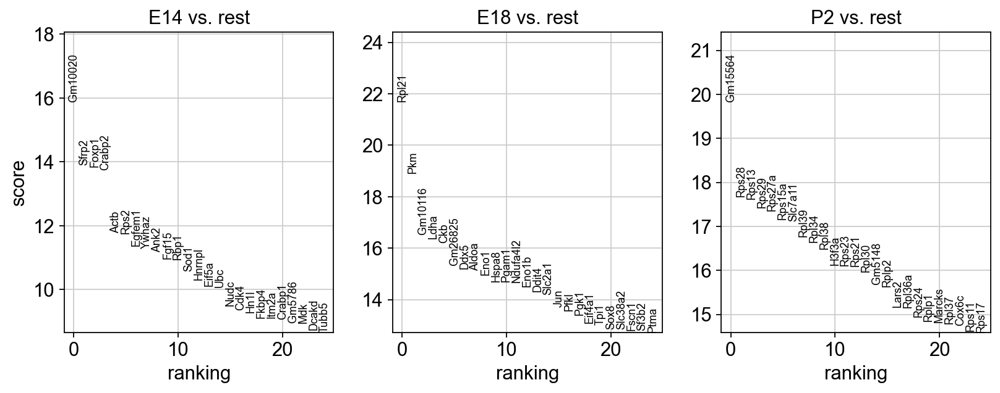

In [79]:
sc.tl.rank_genes_groups(adata, 'Age' ,n_genes=n_genes, method='wilcoxon', key_added = "wilcoxon_Age")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "wilcoxon_Age")

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_louvain']`


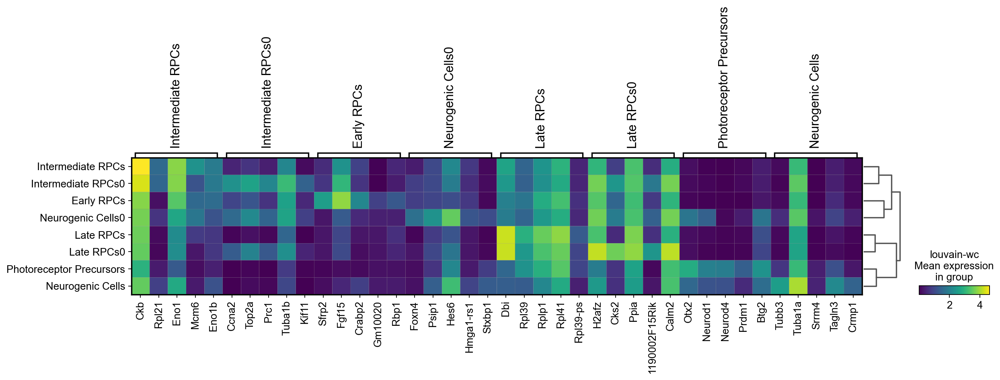

In [80]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon", groupby="louvain", colorbar_title ='louvain-wc\nMean expression\nin group')


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_CellType']`


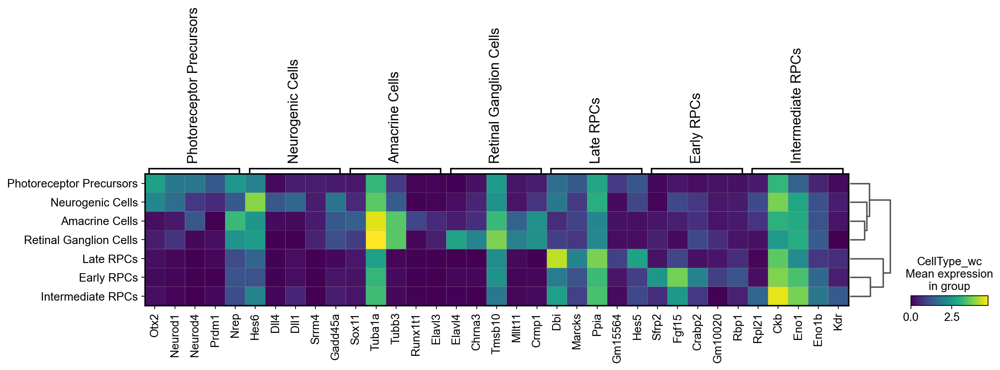

In [81]:

sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="wilcoxon_CellType", groupby="CellType", colorbar_title ='CellType_wc\nMean expression\nin group')


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_Age']`


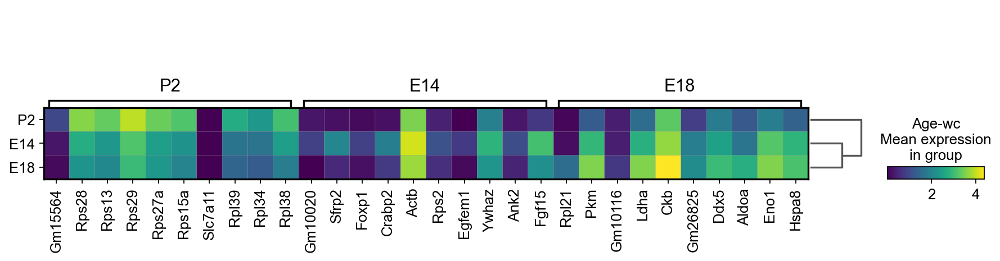

In [82]:

sc.pl.rank_genes_groups_matrixplot(adata, n_genes=10, key="wilcoxon_Age", groupby="Age", colorbar_title ='Age-wc\nMean expression\nin group')


In [83]:
pd.DataFrame(adata.uns['wilcoxon']['names']).head(10)

,Intermediate RPCs,Early RPCs,Photoreceptor Precursors,Late RPCs,Late RPCs0,Intermediate RPCs0,Neurogenic Cells,Neurogenic Cells0
0,Ckb,Sfrp2,Otx2,Dbi,H2afz,Ccna2,Tubb3,Foxn4
1,Rpl21,Fgf15,Neurod1,Rpl39,Cks2,Top2a,Tuba1a,Psip1
2,Eno1,Crabp2,Neurod4,Rplp1,Ppia,Prc1,Srrm4,Hes6
3,Mcm6,Gm10020,Prdm1,Rpl41,1190002F15Rik,Tuba1b,Tagln3,Hmga1-rs1
4,Eno1b,Rbp1,Btg2,Rpl39-ps,Calm2,Kif11,Crmp1,Stxbp1
5,Slc2a1,Foxp1,Nrep,Rps17,Hist1h2ao,Hmgb2,Fam110a,Zc3h12c
6,Car2,Egfem1,Tmsb4x,Rps27a,Dbi,Racgap1,Rassf4,Gadd45a
7,Pkm,Itm2a,Fabp7,Hes5,Snrpg,Kif23,Sox11,Mybl1
8,Gm26825,Zfp36l1,Crx,Rps29,Gm15564,Ckap2l,Tmsb4x,Dll1
9,Kdr,Ano1,Kdm6b,Rpl38,Spc25,Ncapg,Prnp,Rrm2


In [84]:
pd.DataFrame(adata.uns['wilcoxon_CellType']['names']).head(10)

,Amacrine Cells,Early RPCs,Intermediate RPCs,Late RPCs,Neurogenic Cells,Photoreceptor Precursors,Retinal Ganglion Cells
0,Sox11,Sfrp2,Rpl21,Dbi,Hes6,Otx2,Elavl4
1,Tuba1a,Fgf15,Ckb,Marcks,Dll4,Neurod1,Chrna3
2,Tubb3,Crabp2,Eno1,Ppia,Dll1,Neurod4,Tmsb10
3,Runx1t1,Gm10020,Eno1b,Gm15564,Srrm4,Prdm1,Mllt11
4,Elavl3,Rbp1,Kdr,Hes5,Gadd45a,Nrep,Crmp1
5,Tagln3,Foxp1,Slc2a1,Snrpe,Rassf4,Crx,Tuba1a
6,Crmp1,Egfem1,Pkm,Rplp1,Psip1,Fabp7,Gm9844-1
7,Stxbp1,Itm2a,Espn,Rps13,Zc3h12c,Tmsb4x,Tubb3
8,St18,Zfp36l1,Ndufa4l2,Cox6c,Mfng,Btg2,Map1b
9,Adamts4,Sod1,Pgam1,Snrpg,Neurod1,Kdm6b,Rassf4


In [85]:
pd.DataFrame(adata.uns['wilcoxon_Age']['names']).head(10)

,E14,E18,P2
0,Gm10020,Rpl21,Gm15564
1,Sfrp2,Pkm,Rps28
2,Foxp1,Gm10116,Rps13
3,Crabp2,Ldha,Rps29
4,Actb,Ckb,Rps27a
5,Rps2,Gm26825,Rps15a
6,Egfem1,Ddx5,Slc7a11
7,Ywhaz,Aldoa,Rpl39
8,Ank2,Eno1,Rpl34
9,Fgf15,Hspa8,Rpl38


 Marker genes without using raw data


ranking genes
    finished: added to `.uns['rfwilcoxon']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


C:\ProgramData\Anaconda3\envs\retisep\lib\site-packages\scanpy\tools\_rank_genes_groups.py:421: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


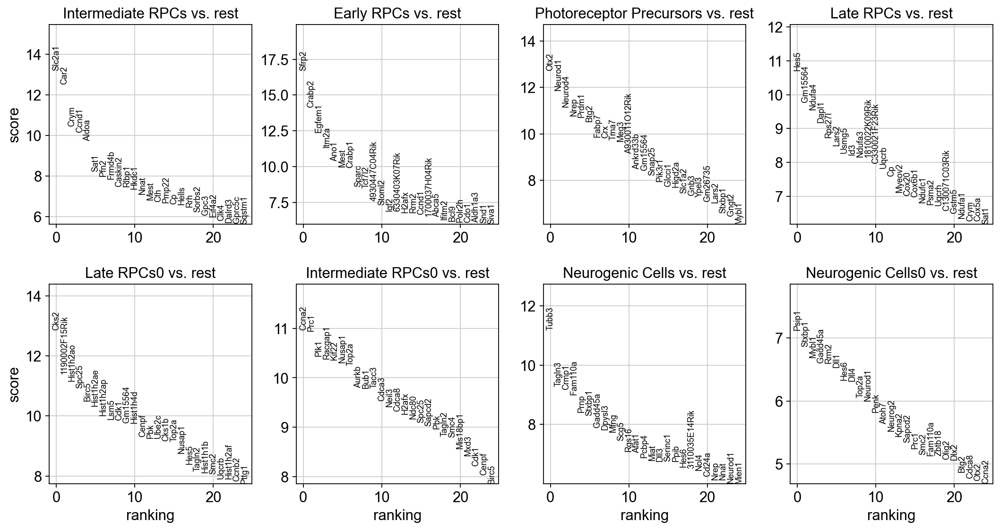

In [86]:
sc.tl.rank_genes_groups(adata, 'louvain' ,n_genes=n_genes, method='wilcoxon',use_raw=False, key_added = "rfwilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "rfwilcoxon")     

ranking genes
    finished: added to `.uns['rfwilcoxon_CellType']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


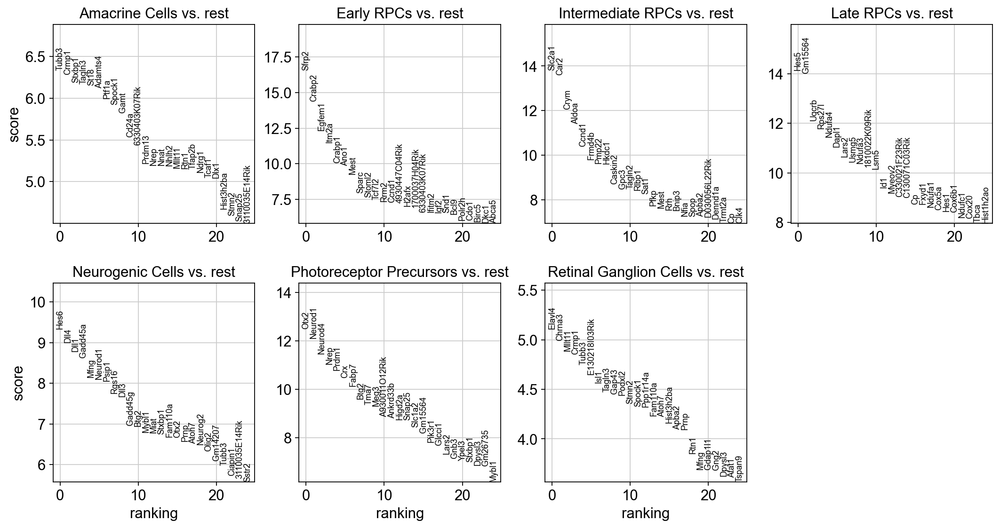

In [87]:
sc.tl.rank_genes_groups(adata, 'CellType' ,n_genes=n_genes, method='wilcoxon',use_raw=False, key_added = "rfwilcoxon_CellType")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "rfwilcoxon_CellType")  
  

ranking genes
    finished: added to `.uns['rfwilcoxon_Age']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:00)


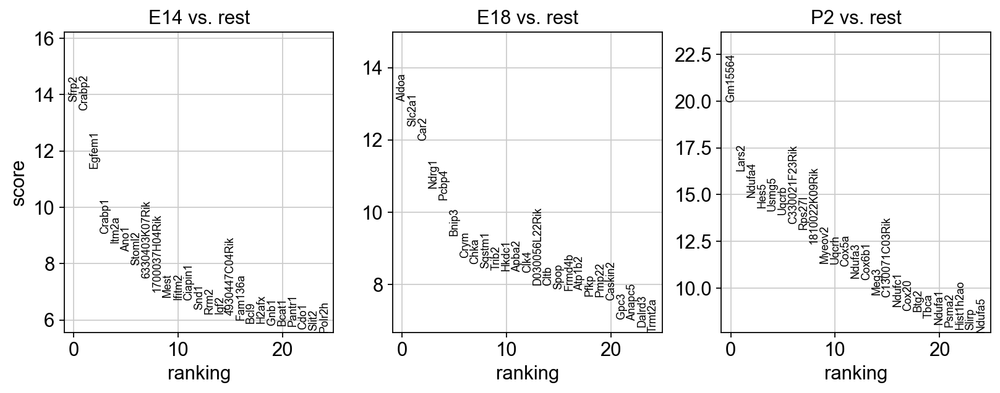

In [88]:

sc.tl.rank_genes_groups(adata, 'Age' ,n_genes=n_genes, method='wilcoxon',use_raw=False, key_added = "rfwilcoxon_Age")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key = "rfwilcoxon_Age")

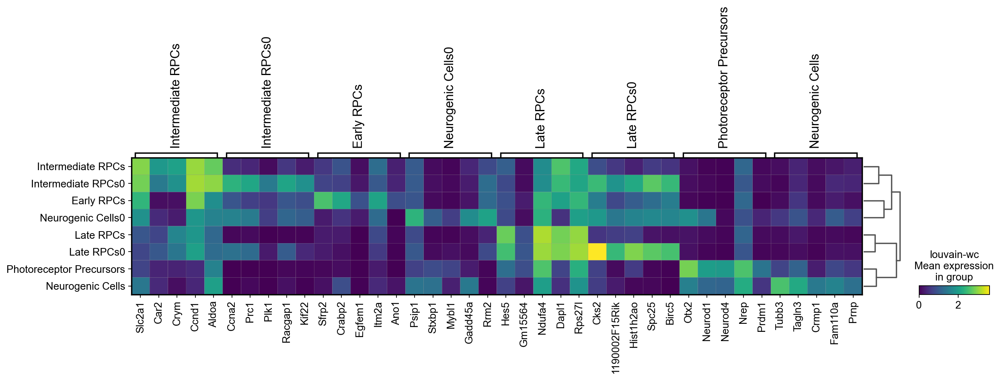

In [89]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="rfwilcoxon", groupby="louvain", colorbar_title ='louvain-wc\nMean expression\nin group')

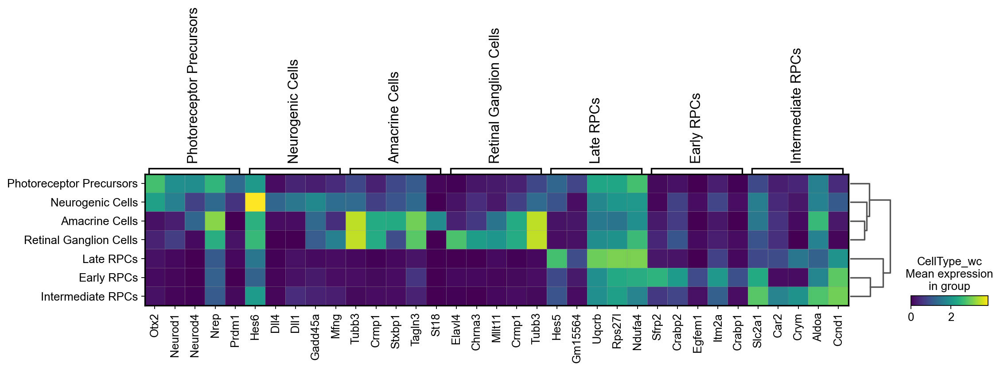

In [90]:
sc.pl.rank_genes_groups_matrixplot(adata, n_genes=5, key="rfwilcoxon_CellType", groupby="CellType", colorbar_title ='CellType_wc\nMean expression\nin group')


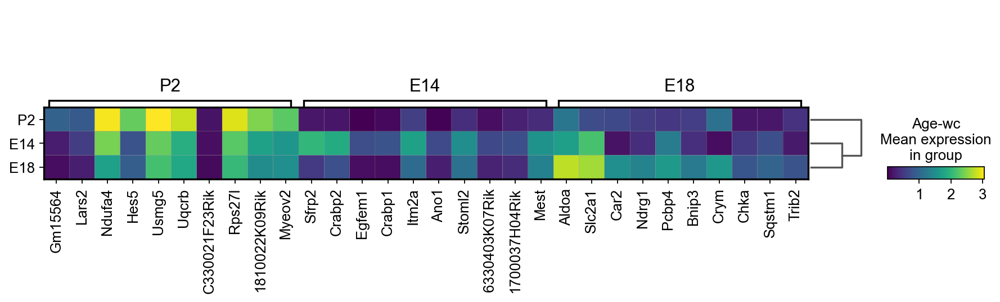

In [91]:

sc.pl.rank_genes_groups_matrixplot(adata, n_genes=10, key="rfwilcoxon_Age", groupby="Age", colorbar_title ='Age-wc\nMean expression\nin group')


In [92]:
pd.DataFrame(adata.uns['rfwilcoxon']['names']).head(10)



,Intermediate RPCs,Early RPCs,Photoreceptor Precursors,Late RPCs,Late RPCs0,Intermediate RPCs0,Neurogenic Cells,Neurogenic Cells0
0,Slc2a1,Sfrp2,Otx2,Hes5,Cks2,Ccna2,Tubb3,Psip1
1,Car2,Crabp2,Neurod1,Gm15564,1190002F15Rik,Prc1,Tagln3,Stxbp1
2,Crym,Egfem1,Neurod4,Ndufa4,Hist1h2ao,Plk1,Crmp1,Mybl1
3,Ccnd1,Itm2a,Nrep,Dapl1,Spc25,Racgap1,Fam110a,Gadd45a
4,Aldoa,Ano1,Prdm1,Rps27l,Birc5,Kif22,Prnp,Rrm2
5,Sat1,Mest,Btg2,Lars2,Hist1h2ae,Nusap1,Stxbp1,Dll1
6,Pfn2,Crabp1,Fabp7,Usmg5,Hist1h2ap,Top2a,Gadd45a,Hes6
7,Frmd4b,Sparc,Crx,Id3,Lsm5,Aurkb,Dpysl3,Dll4
8,Caskin2,Tcf7l2,Tma7,Ndufa3,Cdk1,Bub1,Mfng,Top2a
9,Rlbp1,4930447C04Rik,Meg3,1810022K09Rik,Gm15564,Tacc3,Scg5,Neurod1


In [93]:
pd.DataFrame(adata.uns['rfwilcoxon_CellType']['names']).head(10)


,Amacrine Cells,Early RPCs,Intermediate RPCs,Late RPCs,Neurogenic Cells,Photoreceptor Precursors,Retinal Ganglion Cells
0,Tubb3,Sfrp2,Slc2a1,Hes5,Hes6,Otx2,Elavl4
1,Crmp1,Crabp2,Car2,Gm15564,Dll4,Neurod1,Chrna3
2,Stxbp1,Egfem1,Crym,Uqcrb,Dll1,Neurod4,Mllt11
3,Tagln3,Itm2a,Aldoa,Rps27l,Gadd45a,Nrep,Crmp1
4,St18,Crabp1,Ccnd1,Ndufa4,Mfng,Prdm1,Tubb3
5,Adamts4,Ano1,Frmd4b,Dapl1,Neurod1,Crx,E130218I03Rik
6,Ptf1a,Mest,Pmp22,Lars2,Psip1,Fabp7,Isl1
7,Spock1,Sparc,Hkdc1,Usmg5,Rgs16,Btg2,Tagln3
8,Gamt,Stoml2,Caskin2,Ndufa3,Dll3,Tma7,Gap43
9,Cd24a,Tcf7l2,Gpc3,1810022K09Rik,Gadd45g,Meg3,Podxl2


In [94]:

pd.DataFrame(adata.uns['rfwilcoxon_Age']['names']).head(10)

,E14,E18,P2
0,Sfrp2,Aldoa,Gm15564
1,Crabp2,Slc2a1,Lars2
2,Egfem1,Car2,Ndufa4
3,Crabp1,Ndrg1,Hes5
4,Itm2a,Pcbp4,Usmg5
5,Ano1,Bnip3,Uqcrb
6,Stoml2,Crym,C330021F23Rik
7,6330403K07Rik,Chka,Rps27l
8,1700037H04Rik,Sqstm1,1810022K09Rik
9,Mest,Trib2,Myeov2


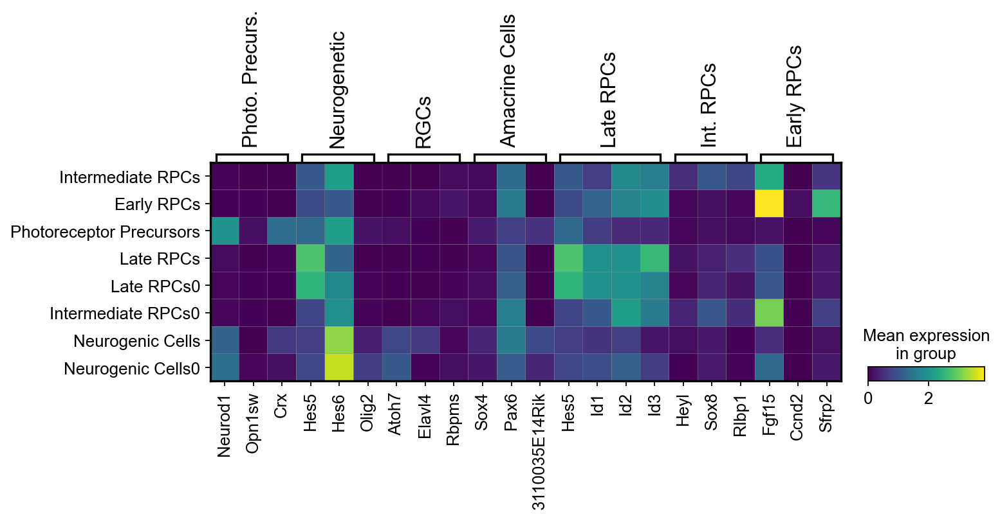

In [95]:
marker_genes = {
'Photo. Precurs.': ['Neurod1', 'Opn1sw', 'Crx'], 
'Neurogenetic': ['Hes5','Hes6', 'Olig2'],
'RGCs': ['Atoh7','Elavl4', 'Rbpms'],
'Amacrine Cells': ['Sox4','Pax6','3110035E14Rik'],
'Late RPCs': ['Hes5','Id1','Id2','Id3'],
'Int. RPCs': ['Heyl','Sox8','Rlbp1'],
'Early RPCs': ['Fgf15','Ccnd2','Sfrp2']
}

sc.pl.matrixplot(adata, marker_genes, groupby='louvain', use_raw=True)